<h1><center><strong><font>Machine Translation</font></strong></center></h1>

<center>
Arrazki Hajar, Blart Louise 

NLP project 2022
</center>

Machine Translation or automated translation is a process when a computer software translates text from one language to another without human involvement. It works with large amounts of source and target languages that are compared and matched against each other by a machine translation engine. We differentiate three types of machine translation methods:
- Rules-based machine translation : use grammar and language rules,
- Statistical machine translation : analyze large amount of existing human translations,
- Neural machine translation : use a large neural network. 

On this project we focus on the third method, which provides better results with language pairs. 
We first introduce the dataset with descriptive analyzes, then we focus on preprocessing, and finally we introduce the model and its results.

# Dataset
For this work we use European Parliament Proceedings Parallel Corpus, available on https://statmt.org/europarl/. It is a corpus of 21 european languages ​​where all the sentences are translated into all the languages. Here, we focus on the English and French languages ​​to be able to check the translations. 

## Installation

In [ ]:
! pip install datasets transformers torchinfo sacrebleu

In [ ]:
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F

import datasets
from datasets import DatasetDict
from datasets import Dataset
from datasets import load_dataset
from pickle import load

import numpy as np
from tqdm import tqdm
import nltk
from gensim.models.phrases import Phrases, Phraser
from nltk.tokenize import TreebankWordTokenizer, TweetTokenizer
import pandas as pd
from termcolor import colored
from collections import Counter
from google.colab import files

from sacrebleu.metrics import BLEU

import string
import re
from pickle import dump
from unicodedata import normalize

## Loading and cleaning the dataset


In [ ]:
# Download the french english corpus
!wget https://statmt.org/europarl/v7/fr-en.tgz
!tar zxvf fr-en.tgz

--2022-04-24 09:01:00--  https://statmt.org/europarl/v7/fr-en.tgz
Resolving statmt.org (statmt.org)... 129.215.197.184
Connecting to statmt.org (statmt.org)|129.215.197.184|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 202718517 (193M) [application/x-gzip]
Saving to: ‘fr-en.tgz’

fr-en.tgz           100%[===================>] 193.33M  1.16MB/s    in 2m 47s  

2022-04-24 09:03:47 (1.16 MB/s) - ‘fr-en.tgz’ saved [202718517/202718517]

europarl-v7.fr-en.en
europarl-v7.fr-en.fr


Now, we create a function that will clean the sentences that form the corpus using regex expressions.

We also create a function that will save the clean corpus, this will help us save time and memory.

In [ ]:
def load_doc(filename):
	'''
	This function load doc into memory
	Args : 
		- filename : file 
	'''
	file = open(filename, mode='rt', encoding='utf-8')
	text = file.read()
	file.close()
	return text
 
def to_sentences(doc):
	'''
	This function split a loaded document into sentences
	Args : 
		- doc : loaded document
	'''
	return doc.strip().split('\n')

def clean_lines(lines):
	'''
	This function clean a list of lines
	Args : 
		- lines : list of lines
	'''
	cleaned = list()
	# prepare regex for char filtering
	re_print = re.compile('[^%s]' % re.escape(string.printable))
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for line in lines:
		# normalize unicode characters
		line = normalize('NFD', line).encode('ascii', 'ignore')
		line = line.decode('UTF-8')
		# tokenize on white space
		line = line.split()
		# convert to lower case
		line = [word.lower() for word in line]
		# remove punctuation from each token
		line = [word.translate(table) for word in line]
		# remove non-printable chars form each token
		line = [re_print.sub('', w) for w in line]
		# remove tokens with numbers in them
		line = [word for word in line if word.isalpha()]
		# store as string
		cleaned.append(' '.join(line))
	return cleaned
 
def save_clean_sentences(sentences, filename):
	'''
	This function save a list of clean sentences to file
	Args : 
		- sentences : list of clean sentences 
		- filename : file to save
	'''
	dump(sentences, open(filename, 'wb'))
	print('Saved: %s' % filename)

The cleaned version of the english dataset will be saved in `english.pkl`, and the one for the french dataset is `french.pkl`

In [ ]:
# load English data
filename = 'europarl-v7.fr-en.en'
doc = load_doc(filename)
sentences = to_sentences(doc)
sentences = clean_lines(sentences)
save_clean_sentences(sentences, 'english.pkl')
# spot check
for i in range(10):
	print(sentences[i])

Saved: english.pkl
resumption of the session
i declare resumed the session of the european parliament adjourned on friday december and i would like once again to wish you a happy new year in the hope that you enjoyed a pleasant festive period
although as you will have seen the dreaded millennium bug failed to materialise still the people in a number of countries suffered a series of natural disasters that truly were dreadful
you have requested a debate on this subject in the course of the next few days during this partsession
in the meantime i should like to observe a minute s silence as a number of members have requested on behalf of all the victims concerned particularly those of the terrible storms in the various countries of the european union
please rise then for this minute s silence
the house rose and observed a minute s silence
madam president on a point of order
you will be aware from the press and television that there have been a number of bomb explosions and killings in sri

In [ ]:
# load French data
filename = 'europarl-v7.fr-en.fr'
doc = load_doc(filename)
sentences = to_sentences(doc)
sentences = clean_lines(sentences)
save_clean_sentences(sentences, 'french.pkl')
# spot check
for i in range(10):
	print(sentences[i])

Saved: french.pkl
reprise de la session
je declare reprise la session du parlement europeen qui avait ete interrompue le vendredi decembre dernier et je vous renouvelle tous mes vux en esperant que vous avez passe de bonnes vacances
comme vous avez pu le constater le grand bogue de lan ne sest pas produit en revanche les citoyens dun certain nombre de nos pays ont ete victimes de catastrophes naturelles qui ont vraiment ete terribles
vous avez souhaite un debat a ce sujet dans les prochains jours au cours de cette periode de session
en attendant je souhaiterais comme un certain nombre de collegues me lont demande que nous observions une minute de silence pour toutes les victimes des tempetes notamment dans les differents pays de lunion europeenne qui ont ete touches
je vous invite a vous lever pour cette minute de silence
le parlement debout observe une minute de silence
madame la presidente cest une motion de procedure
vous avez probablement appris par la presse et par la television q

We reload our saved corpuses so we can create the proper dataset

In [ ]:
def load_doc(filename):
	return load(open(filename, 'rb'))

# Load english and french data
enSentences = load_doc('english.pkl')
frSentences = load_doc('french.pkl')

Here we delete the dupplicated lines and the ones that present matching errors between the English and the French sentences.

In [ ]:
# Simpliest to treat with dataset
df = pd.DataFrame(enSentences,columns=['English'])
df['French'] = frSentences

# Drop duplicates
no_duplicate = df.drop_duplicates(subset = ['English','French'], keep = 'first').reset_index(drop = True)

# Drop incomplete translations 
no_duplicate = no_duplicate.drop(no_duplicate[no_duplicate.English == ''].index) 
no_duplicate = no_duplicate.drop(no_duplicate[no_duplicate.French == ''].index) 

enSentences = list(no_duplicate['English'])
frSentences = list(no_duplicate['French'])

In [ ]:
enSentences[:2]

['resumption of the session',
 'i declare resumed the session of the european parliament adjourned on friday december and i would like once again to wish you a happy new year in the hope that you enjoyed a pleasant festive period']

In [ ]:
frSentences[:2]

['reprise de la session',
 'je declare reprise la session du parlement europeen qui avait ete interrompue le vendredi decembre dernier et je vous renouvelle tous mes vux en esperant que vous avez passe de bonnes vacances']

Now we want to use Pytorch Datasets so it is easier to use as inputs in the models we will be using next.

To do so, we create a dictionnary of matching sentences that we call `translation`. This dictionary will then be passed into a Dataset so that we will get a HuggingFace like dataset.

In [ ]:
l = []
for i in range(len(enSentences)-1):
  di = {}
  di['en'] = enSentences[i]
  di['fr'] = frSentences[i]
  l.append(di)

In [ ]:
translation_dict = {'translation': l}

In [ ]:
enfr_complete = Dataset.from_dict(translation_dict)

This forms the entire dataset that we name `enfr_complete`

In [ ]:
enfr_complete

Dataset({
    features: ['translation'],
    num_rows: 1956415
})

In [ ]:
enfr_complete[0]

{'translation': {'en': 'resumption of the session',
  'fr': 'reprise de la session'}}

## Descriptive analyzes 

Now, let's dive into our cleaned dataset so we can understand its general properties.

To do this, we will use a classic pandas dataframe `df`, much easier to deal with for analysis purposes.

In [ ]:
df = pd.DataFrame(enSentences,columns=['English'])
df['French'] = frSentences

In [ ]:
df.head()

,English,French
0,resumption of the session,reprise de la session
1,i declare resumed the session of the european ...,je declare reprise la session du parlement eur...
2,although as you will have seen the dreaded mil...,comme vous avez pu le constater le grand bogue...
3,you have requested a debate on this subject in...,vous avez souhaite un debat a ce sujet dans le...
4,in the meantime i should like to observe a min...,en attendant je souhaiterais comme un certain ...


In [ ]:
#Total Records
print("Total sentences: ", df.shape[0])

Total sentences:  2007720


In [ ]:
#Checking for Null/Missing Values
df.isna().sum()

English    0
French     0
dtype: int64

In [ ]:
df_drop = df.drop_duplicates()

In [ ]:
#Total Records
print("Shape without duplicates: ", df_drop.shape[0])

Shape without duplicates:  1960888


In [ ]:
#Number of duplicates
print("Number of duplicates: ", df.shape[0] - df_drop.shape[0])

Number of duplicates:  46835


In [ ]:
df = df.drop_duplicates()

In [ ]:
len(df)

1960888

In [ ]:
df.head()

,English,French
0,resumption of the session,reprise de la session
1,i declare resumed the session of the european ...,je declare reprise la session du parlement eur...
2,although as you will have seen the dreaded mil...,comme vous avez pu le constater le grand bogue...
3,you have requested a debate on this subject in...,vous avez souhaite un debat a ce sujet dans le...
4,in the meantime i should like to observe a min...,en attendant je souhaiterais comme un certain ...


In [ ]:
# Mean length of content in characters
df.English.drop_duplicates().apply(len).mean()

148.6646757556455

In [ ]:
# Mean length of content in characters
df.French.drop_duplicates().apply(len).mean()

164.4462771033716

In [ ]:
import matplotlib.pyplot as plt

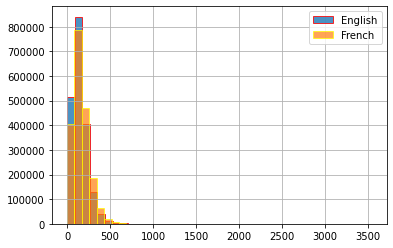

In [ ]:
# Repartition of the content lengths (characters)
%matplotlib inline
df.English.drop_duplicates().apply(len).hist(bins=40, label='English', alpha=.8, edgecolor='red')
df.French.drop_duplicates().apply(len).hist(bins=40, label='French', alpha=0.7, edgecolor='yellow')
plt.legend()

In [ ]:
import nltk
# let's add some basic information about the text: number of "words" (here we split by using WordPunctTokenizer)
df['en_len'] = df.English.apply(lambda x: len(nltk.tokenize.WordPunctTokenizer().tokenize(x)) )
df['fr_len'] = df.French.apply(lambda x: len(nltk.tokenize.WordPunctTokenizer().tokenize(x)) )

In [ ]:
df.head()

,English,French,en_len,fr_len
0,resumption of the session,reprise de la session,4,4
1,i declare resumed the session of the european ...,je declare reprise la session du parlement eur...,36,32
2,although as you will have seen the dreaded mil...,comme vous avez pu le constater le grand bogue...,31,36
3,you have requested a debate on this subject in...,vous avez souhaite un debat a ce sujet dans le...,19,19
4,in the meantime i should like to observe a min...,en attendant je souhaiterais comme un certain ...,40,38


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
fig = make_subplots(rows=1, cols=2, subplot_titles=("English","French"))

fig.add_trace(
    go.Histogram(x=df['en_len'],histfunc='sum',opacity =0.8,showlegend=False,text='Eng'), row=1,col=1)

fig.add_trace(
    go.Histogram(x=df['fr_len'],histfunc='sum', opacity =0.8,showlegend=False,text='Frn'), row=1,col=2)

fig.update_layout(height=600, width=800, title_text="Words Distribution")
fig.show()


In [ ]:
print( '{} English Words'.format(df['en_len'].sum()) ) 
print('{} French Words'.format(df['fr_len'].sum()) )

49406959 English Words
51609668 French Words


In [ ]:
eval_cols = ["en_len", 'fr_len']
df[eval_cols].std()

en_len    14.702903
fr_len    15.468066
dtype: float64

We now wish to get a closer look at the contents of the dataset. 

What are the most significant words that are used? What is the specificity of the europarl dataset?

We will use a wordcloud to have a generic understanding about this corpus.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [ ]:
df.head()

,English,French,en_len,fr_len
0,resumption of the session,reprise de la session,4,4
1,i declare resumed the session of the european ...,je declare reprise la session du parlement eur...,36,32
2,although as you will have seen the dreaded mil...,comme vous avez pu le constater le grand bogue...,31,36
3,you have requested a debate on this subject in...,vous avez souhaite un debat a ce sujet dans le...,19,19
4,in the meantime i should like to observe a min...,en attendant je souhaiterais comme un certain ...,40,38


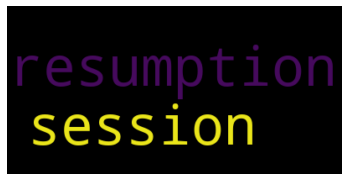

In [ ]:
text = df.English[0]

# Create and generate a word cloud image:
wordcloud = WordCloud().generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
df_short = df[:1000]

In [ ]:
df_short.head()

,English,French,en_len,fr_len
0,resumption of the session,reprise de la session,4,4
1,i declare resumed the session of the european ...,je declare reprise la session du parlement eur...,36,32
2,although as you will have seen the dreaded mil...,comme vous avez pu le constater le grand bogue...,31,36
3,you have requested a debate on this subject in...,vous avez souhaite un debat a ce sujet dans le...,19,19
4,in the meantime i should like to observe a min...,en attendant je souhaiterais comme un certain ...,40,38


In [ ]:
text = " ".join(review for review in df_short.English)
print ("There are {} words in the combination of all review.".format(len(text)))

There are 162171 words in the combination of all review.


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

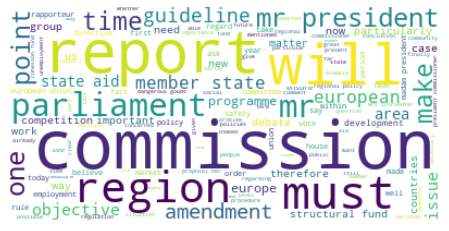

In [ ]:
# Create stopword list:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(15,4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

The english sentences show that the corpus has to do with politicall institutions, the law and policies.

This intuition is confirmed by the word cloud of the french sentences.

In [ ]:
from nltk.corpus import stopwords
text = " ".join(review for review in df_short.French)
print ("There are {} words in the combination of all review.".format(len(text)))

There are 175811 words in the combination of all review.


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

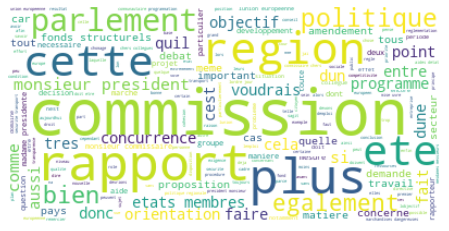

In [ ]:
# Create stopword list:
stopwords = set(stopwords.words('french'))

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(15,4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

We now want to check if the Zipf law is true for a short portion of our dataset.

  0%|          | 0/3 [00:00<?, ?it/s]

Counter({'the': 2117, 'of': 1057, 'to': 992, 'and': 796, 'in': 698, 'is': 450, 'a': 435, 'that': 422, 'this': 374, 'i': 349, 'for': 332, 'we': 300, 'on': 291, 'be': 246, 'which': 226, 'it': 225, 'as': 217, 'are': 197, 'not': 195, 'have': 190, 'commission': 156, 'mr': 153, 'with': 153, 'by': 147, 'would': 139, 'has': 133, 'report': 118, 'european': 108, 'like': 106, 'you': 106, 'been': 104, 'should': 101, 'president': 101, 'will': 100, 'there': 96, 'also': 95, 'regions': 91, 'all': 90, 'our': 90, 'an': 88, 'but': 86, 'policy': 84, 'these': 83, 's': 82, 'parliament': 80, 'more': 79, 'aid': 78, 'must': 75, 'at': 74, 'my': 72, 'regional': 72, 'or': 67, 'can': 64, 'development': 64, 'union': 63, 'very': 61, 'so': 60, 'they': 60, 'one': 59, 'social': 58, 'their': 57, 'funds': 57, 'if': 56, 'member': 56, 'states': 56, 'state': 55, 'competition': 55, 'structural': 55, 'from': 54, 'do': 54, 'committee': 53, 'was': 51, 'economic': 50, 'what': 49, 'transport': 49, 'make': 48, 'guidelines': 48, 't

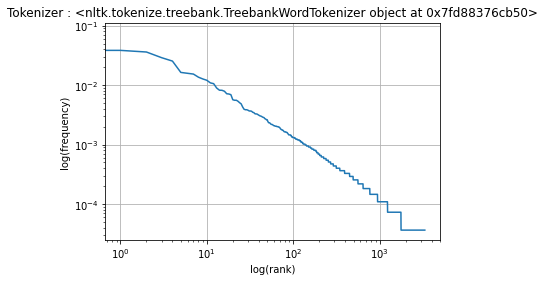

Counter({'the': 2117, 'of': 1057, 'to': 992, 'and': 796, 'in': 698, 'is': 450, 'a': 435, 'that': 422, 'this': 374, 'i': 349, 'for': 332, 'we': 300, 'on': 291, 'be': 246, 'which': 226, 'it': 225, 'as': 217, 'are': 197, 'have': 190, 'not': 181, 'commission': 156, 'mr': 153, 'with': 153, 'by': 147, 'would': 139, 'has': 133, 'report': 118, 'european': 108, 'like': 106, 'you': 106, 'been': 104, 'should': 101, 'president': 101, 'will': 100, 'there': 96, 'also': 95, 'regions': 91, 'all': 90, 'our': 90, 'an': 88, 'but': 86, 'policy': 84, 'these': 83, 's': 82, 'parliament': 80, 'more': 79, 'aid': 78, 'must': 75, 'at': 74, 'my': 72, 'regional': 72, 'or': 67, 'development': 64, 'union': 63, 'very': 61, 'so': 60, 'they': 60, 'one': 59, 'social': 58, 'their': 57, 'funds': 57, 'if': 56, 'member': 56, 'states': 56, 'state': 55, 'competition': 55, 'structural': 55, 'from': 54, 'do': 54, 'committee': 53, 'was': 51, 'can': 50, 'economic': 50, 'what': 49, 'transport': 49, 'make': 48, 'guidelines': 48, 't

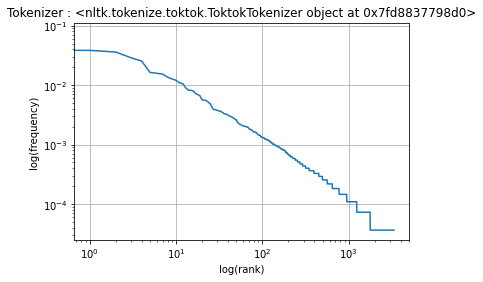

Counter({'the': 2117, 'of': 1057, 'to': 992, 'and': 796, 'in': 698, 'is': 450, 'a': 435, 'that': 422, 'this': 374, 'i': 349, 'for': 332, 'we': 300, 'on': 291, 'be': 246, 'which': 226, 'it': 225, 'as': 217, 'are': 197, 'have': 190, 'not': 181, 'commission': 156, 'mr': 153, 'with': 153, 'by': 147, 'would': 139, 'has': 133, 'report': 118, 'european': 108, 'like': 106, 'you': 106, 'been': 104, 'should': 101, 'president': 101, 'will': 100, 'there': 96, 'also': 95, 'regions': 91, 'all': 90, 'our': 90, 'an': 88, 'but': 86, 'policy': 84, 'these': 83, 's': 82, 'parliament': 80, 'more': 79, 'aid': 78, 'must': 75, 'at': 74, 'my': 72, 'regional': 72, 'or': 67, 'development': 64, 'union': 63, 'very': 61, 'so': 60, 'they': 60, 'one': 59, 'social': 58, 'their': 57, 'funds': 57, 'if': 56, 'member': 56, 'states': 56, 'state': 55, 'competition': 55, 'structural': 55, 'from': 54, 'do': 54, 'committee': 53, 'was': 51, 'can': 50, 'economic': 50, 'what': 49, 'transport': 49, 'make': 48, 'guidelines': 48, 't

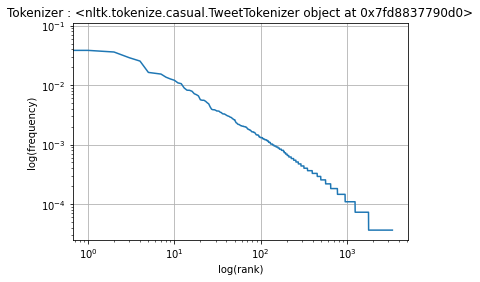

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
from nltk.tokenize import TreebankWordTokenizer
from nltk.tokenize import ToktokTokenizer
from nltk.tokenize import TweetTokenizer
from tqdm.notebook import tqdm
%matplotlib inline
tokenizers = [TreebankWordTokenizer(), ToktokTokenizer(), TweetTokenizer()]

for tok in tqdm(tokenizers):
  arr = df_short.English.drop_duplicates().apply(lambda x: tok.tokenize(x)).array
  # We flatten the list. We could use this : arr = reduce(add, arr)   but it would take too much time.
  arr = [ x for X in arr for x in X]
  # We use reduce to concatenate all the lists in arr, but we don't use "set" 
  # so that we can count occurencies with a Counter object 
  c = Counter(arr)
  print(c)
  # Formating the counter object to a proper dataset
  d = pd.DataFrame(c, index=['occurrences']).transpose().reset_index()
  d.columns=['word', 'occurences']
  # Computing frequencies instead of occurences
  nb_total = d.occurences.sum()
  d['freq'] = d.occurences.apply(lambda x: x/nb_total)
  # Sorting by frequency, most frequent word at the top of the df
  d = d.sort_values('freq', ascending=False)
  plt.figure()
  plt.grid()
  plt.xscale('log')  # Using log scale
  plt.yscale('log')  # Using log scale
  plt.xlabel('log(rank)')
  plt.ylabel('log(frequency)')
  plt.title("Tokenizer : {0}".format(tok))
  x = list(range(d.shape[0]))
  plt.plot(x, d.freq)
  plt.show()

  0%|          | 0/3 [00:00<?, ?it/s]

Counter({'de': 1479, 'la': 1034, 'le': 741, 'et': 741, 'a': 685, 'des': 646, 'les': 612, 'que': 510, 'en': 447, 'nous': 341, 'du': 323, 'dans': 294, 'pour': 293, 'je': 288, 'qui': 257, 'ce': 252, 'est': 236, 'une': 220, 'sur': 215, 'un': 205, 'commission': 201, 'au': 180, 'l': 180, 'par': 171, 'il': 171, 'pas': 170, 'ne': 143, 'plus': 123, 'rapport': 119, 'vous': 118, 'monsieur': 117, 'aux': 106, 'cette': 102, 'ou': 100, 'regions': 94, 'ces': 92, 'parlement': 89, 'politique': 88, 'mais': 87, 'ete': 83, 'd': 80, 'fonds': 75, 'president': 74, 'tout': 69, 'voudrais': 69, 'sont': 69, 'ont': 68, 'europeenne': 68, 'si': 67, 'etre': 65, 'm': 64, 'bien': 60, 'developpement': 59, 'aides': 59, 'egalement': 58, 'avec': 58, 'comme': 57, 'fait': 57, 'se': 57, 'etats': 57, 'concurrence': 56, 'entre': 53, 'pays': 52, 'y': 52, 'quil': 52, 'dune': 51, 'meme': 51, 'membres': 50, 'point': 50, 'cest': 48, 'faire': 48, 'notre': 48, 'on': 47, 'madame': 46, 'son': 46, 'tres': 46, 'leur': 45, 'aussi': 45, 'se

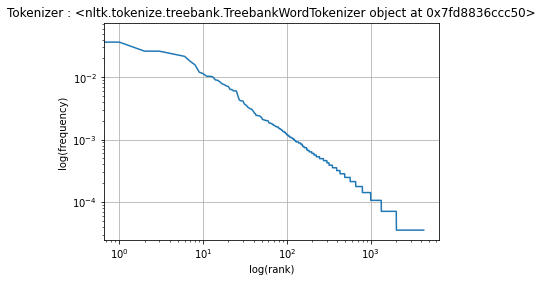

Counter({'de': 1479, 'la': 1034, 'le': 741, 'et': 741, 'a': 685, 'des': 646, 'les': 612, 'que': 510, 'en': 447, 'nous': 341, 'du': 323, 'dans': 294, 'pour': 293, 'je': 288, 'qui': 257, 'ce': 252, 'est': 236, 'une': 220, 'sur': 215, 'un': 205, 'commission': 201, 'au': 180, 'l': 180, 'par': 171, 'il': 171, 'pas': 170, 'ne': 143, 'plus': 123, 'rapport': 119, 'vous': 118, 'monsieur': 117, 'aux': 106, 'cette': 102, 'ou': 100, 'regions': 94, 'ces': 92, 'parlement': 89, 'politique': 88, 'mais': 87, 'ete': 83, 'd': 80, 'fonds': 75, 'president': 74, 'tout': 69, 'voudrais': 69, 'sont': 69, 'ont': 68, 'europeenne': 68, 'si': 67, 'etre': 65, 'm': 64, 'bien': 60, 'developpement': 59, 'aides': 59, 'egalement': 58, 'avec': 58, 'comme': 57, 'fait': 57, 'se': 57, 'etats': 57, 'concurrence': 56, 'entre': 53, 'pays': 52, 'y': 52, 'quil': 52, 'dune': 51, 'meme': 51, 'membres': 50, 'point': 50, 'cest': 48, 'faire': 48, 'notre': 48, 'on': 47, 'madame': 46, 'son': 46, 'tres': 46, 'leur': 45, 'aussi': 45, 'se

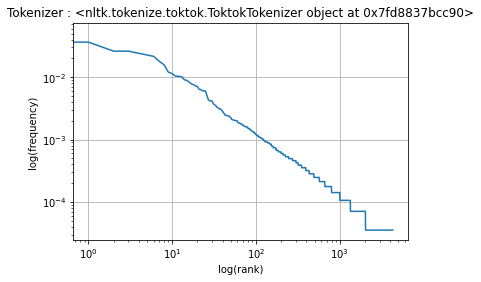

Counter({'de': 1479, 'la': 1034, 'le': 741, 'et': 741, 'a': 685, 'des': 646, 'les': 612, 'que': 510, 'en': 447, 'nous': 341, 'du': 323, 'dans': 294, 'pour': 293, 'je': 288, 'qui': 257, 'ce': 252, 'est': 236, 'une': 220, 'sur': 215, 'un': 205, 'commission': 201, 'au': 180, 'l': 180, 'par': 171, 'il': 171, 'pas': 170, 'ne': 143, 'plus': 123, 'rapport': 119, 'vous': 118, 'monsieur': 117, 'aux': 106, 'cette': 102, 'ou': 100, 'regions': 94, 'ces': 92, 'parlement': 89, 'politique': 88, 'mais': 87, 'ete': 83, 'd': 80, 'fonds': 75, 'president': 74, 'tout': 69, 'voudrais': 69, 'sont': 69, 'ont': 68, 'europeenne': 68, 'si': 67, 'etre': 65, 'm': 64, 'bien': 60, 'developpement': 59, 'aides': 59, 'egalement': 58, 'avec': 58, 'comme': 57, 'fait': 57, 'se': 57, 'etats': 57, 'concurrence': 56, 'entre': 53, 'pays': 52, 'y': 52, 'quil': 52, 'dune': 51, 'meme': 51, 'membres': 50, 'point': 50, 'cest': 48, 'faire': 48, 'notre': 48, 'on': 47, 'madame': 46, 'son': 46, 'tres': 46, 'leur': 45, 'aussi': 45, 'se

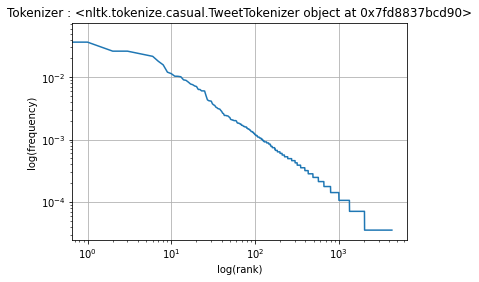

In [ ]:
%matplotlib inline
tokenizers = [TreebankWordTokenizer(), ToktokTokenizer(), TweetTokenizer()]

for tok in tqdm(tokenizers):
  arr = df_short.French.drop_duplicates().apply(lambda x: tok.tokenize(x)).array
  # We flatten the list. We could use this : arr = reduce(add, arr)   but it would take too much time.
  arr = [ x for X in arr for x in X]
  # We use reduce to concatenate all the lists in arr, but we don't use "set" 
  # so that we can count occurencies with a Counter object 
  c = Counter(arr)
  print(c)
  # Formating the counter object to a proper dataset
  d = pd.DataFrame(c, index=['occurrences']).transpose().reset_index()
  d.columns=['word', 'occurences']
  # Computing frequencies instead of occurences
  nb_total = d.occurences.sum()
  d['freq'] = d.occurences.apply(lambda x: x/nb_total)
  # Sorting by frequency, most frequent word at the top of the df
  d = d.sort_values('freq', ascending=False)
  plt.figure()
  plt.grid()
  plt.xscale('log')  # Using log scale
  plt.yscale('log')  # Using log scale
  plt.xlabel('log(rank)')
  plt.ylabel('log(frequency)')
  plt.title("Tokenizer : {0}".format(tok))
  x = list(range(d.shape[0]))
  plt.plot(x, d.freq)
  plt.show()

Zipf's law clearly applies 

## Select the translation dataset

As our dataset is quite huge, we wish to reduce its size by only selecting short sentences.

Therefore we create a csv file that will store the indices of the short sentences and save it on a github repository so it can be called directly without re-runing the whole notebook

In [ ]:
short_sentence_index=[i for i,sentences in enumerate(frSentences) if len(sentences)<40]
# We do the same for len(sentences)<20 , len(sentences)<30, len(sentences)<50 , len(sentences)<75, len(sentences)<100

# Download indexes to not have to run all the previous cells each time
from google.colab import files
d = {'short_sentence_index': short_sentence_index}
df = pd.DataFrame(data=d)
df.to_csv('short_sentence_index_inf40.csv', encoding = 'utf-8-sig') 
files.download('short_sentence_index_inf40.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using the indices we have stored, we select a portion of the dataset.

In [ ]:
!wget https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/short_sentence_index_inf30.csv

--2022-04-23 20:35:42--  https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/short_sentence_index_inf30.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 446506 (436K) [text/plain]
Saving to: ‘short_sentence_index_inf30.csv’

short_sentence_inde 100%[===================>] 436.04K  --.-KB/s    in 0.04s   

2022-04-23 20:35:42 (11.9 MB/s) - ‘short_sentence_index_inf30.csv’ saved [446506/446506]



In [ ]:
df_short_sentence_index =pd.read_csv('short_sentence_index_inf30.csv')  
df_short_sentence_index=df_short_sentence_index.drop('Unnamed: 0',axis=1)
short_sentence_index = list(df_short_sentence_index['short_sentence_index'])

In [ ]:
# We keep a sub-dataset of size 130 141
enfr = enfr_complete.select(short_sentence_index)

In [ ]:
enfr

Dataset({
    features: ['translation'],
    num_rows: 130141
})

We store this dataset in a json file on github so that we can directly load it without having to re-run the whole notebook.

This also allows us to save some memory.

In [ ]:
# Download the datasets ( we do that for enfr20, enfr30, enfr40, enfr50)
from google.colab import files
enfr.to_json("enfr50.json")
files.download('enfr50.json')

We only use enfr40, which is the dataset with sentences length lower than 40, to have a balance between a sufficiently large database and to preserve the RAM.

In [ ]:
# Load with github
!wget https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/enfr40.json

--2022-04-24 15:20:38--  https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/enfr40.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7043212 (6.7M) [text/plain]
Saving to: ‘enfr40.json.1’

enfr40.json.1       100%[===================>]   6.72M  --.-KB/s    in 0.08s   

2022-04-24 15:20:38 (84.5 MB/s) - ‘enfr40.json.1’ saved [7043212/7043212]



In [ ]:
enfr = load_dataset('json', data_files='enfr40.json',split='train')

Using custom data configuration default-53b688f5353c736d
Reusing dataset json (/root/.cache/huggingface/datasets/json/default-53b688f5353c736d/0.0.0/ac0ca5f5289a6cf108e706efcf040422dbbfa8e658dee6a819f20d76bb84d26b)


Then, we get our reduced dataset.

In [ ]:
enfr

Dataset({
    features: ['translation'],
    num_rows: 75437
})

In [ ]:
enfr['translation']

[{'en': 'resumption of the session', 'fr': 'reprise de la session'},
 {'en': 'it is the case of alexander nikitin',
  'fr': 'il sagit du cas dalexandre nikitin'},
 {'en': 'we do not know what is happening',
  'fr': 'nous ne savons pas ce qui se passe'},
 {'en': 'agenda', 'fr': 'ordre des travaux'},
 {'en': 'relating to wednesday', 'fr': 'en ce qui concerne le mercredi'},
 {'en': 'applause from the pse group', 'fr': 'applaudissements du groupe pse'},
 {'en': 'thank you mr poettering', 'fr': 'merci monsieur poettering'},
 {'en': 'it is not a lot to ask', 'fr': 'ce n est pas demander beaucoup'},
 {'en': 'thank you very much', 'fr': 'merci'},
 {'en': 'my vote was in favour', 'fr': 'jai vote pour'},
 {'en': 'there is no room for amendments',
  'fr': 'les modifications nont pas lieu detre'},
 {'en': 'that did not happen', 'fr': 'mais ma demande na pas ete satisfaite'},
 {'en': 'this is an important matter', 'fr': 'cest important'},
 {'en': 'this seems to me to be a workable solution',
  'fr'

# Data representation

In [ ]:
UNK_IDX, PAD_IDX, SOS_IDX, EOS_IDX = 0, 1, 2, 3
special_symbols = ['<unk>', '<pad>', '<sos>', '<eos>']

Let's try a simple tokenization on one element of the corpus


In [ ]:
tok = TweetTokenizer()
entry = enfr[0]['translation']
tokens = tok.tokenize(entry['fr'].lower().strip())
print(tokens)

['reprise', 'de', 'la', 'session']


## Build a Vocabulary from Scratch

**Create our own vocab manually**, a dictionary `VOC` with multiple keys.
For each language `'en', 'fr'`:
- `counts`is the number of occurrence per token
- `stoi` is the String To Index mapping
- `itos` is the Index to String mapping
- `nbwords`is the global number of words


In [ ]:
# stoi string to index
# itos index to string

VOC_enfr = {'en': {'stoi': {}, 'counts': {}, 'nbwords': 0}, 'fr': {'stoi': {}, 'counts': {}, 'nbwords': 0}}
LANGS = ['fr', 'en']

def update_VOC(VOC) :
  '''
  This function update a vocabulary such as 
  VOC = {'en': {'stoi': {}, 'counts': {}, 'nbwords': 0}, 'fr': {'stoi': {}, 'counts': {}, 'nbwords': 0}}
  Args : 
    - VOC : vocabulary of type dict
  '''
  for lang in LANGS:
    for t in special_symbols: 
      VOC[lang]['stoi'][t] = VOC[lang]['nbwords']
      VOC[lang]['counts'][t] = 1
      VOC[lang]['nbwords'] += 1

def parse_entry(entry,VOC):
  '''
  This function update a vocabulary with entries of a dataset. 
  Args :
    - entry : entry of a dataset 
    - VOC : vocabulary of type dict
  '''
  for lang in LANGS:
    tokens = tok.tokenize(entry['translation'][lang].lower().strip())
    for t in tokens:
      if t not in VOC[lang]['stoi']: 
        VOC[lang]['stoi'][t] = VOC[lang]['nbwords']
        VOC[lang]['counts'][t] = 1
        VOC[lang]['nbwords'] += 1
      else:
        VOC[lang]['counts'][t] = VOC[lang]['counts'][t] + 1

def build_vocabulary (VOC, dataset) :
  '''
  This function build a entire vocabulary from a dataset 
  Args : 
    - VOC : vocabulary of type dict
    - dataset : dataset of type datadict
  '''
  update_VOC(VOC)
  for entry in tqdm(dataset): 
    parse_entry(entry,VOC)
  for lang in LANGS:
    VOC[lang]['itos'] = { v:k for k,v in VOC[lang]['stoi'].items()}

In [ ]:
build_vocabulary(VOC_enfr,enfr)

100%|██████████| 75437/75437 [00:21<00:00, 3548.23it/s]


In [ ]:
print(VOC_enfr['fr']['itos'])

{0: '<unk>', 1: '<pad>', 2: '<sos>', 3: '<eos>', 4: 'reprise', 5: 'de', 6: 'la', 7: 'session', 8: 'il', 9: 'sagit', 10: 'du', 11: 'cas', 12: 'dalexandre', 13: 'nikitin', 14: 'nous', 15: 'ne', 16: 'savons', 17: 'pas', 18: 'ce', 19: 'qui', 20: 'se', 21: 'passe', 22: 'ordre', 23: 'des', 24: 'travaux', 25: 'en', 26: 'concerne', 27: 'le', 28: 'mercredi', 29: 'applaudissements', 30: 'groupe', 31: 'pse', 32: 'merci', 33: 'monsieur', 34: 'poettering', 35: 'n', 36: 'est', 37: 'demander', 38: 'beaucoup', 39: 'jai', 40: 'vote', 41: 'pour', 42: 'les', 43: 'modifications', 44: 'nont', 45: 'lieu', 46: 'detre', 47: 'mais', 48: 'ma', 49: 'demande', 50: 'na', 51: 'ete', 52: 'satisfaite', 53: 'cest', 54: 'important', 55: 'me', 56: 'semble', 57: 'que', 58: 'une', 59: 'bonne', 60: 'formule', 61: 'je', 62: 'vous', 63: 'votre', 64: 'approbation', 65: 'felicite', 66: 'son', 67: 'excellent', 68: 'rapport', 69: 'dans', 70: 'un', 71: 'certain', 72: 'sens', 73: 'dommage', 74: 'bref', 75: 'sujet', 76: 'tres', 77:

In [ ]:
print('fr', VOC_enfr['fr']['nbwords'], 'en', VOC_enfr['en']['nbwords'])

fr 19601 en 14306


In [ ]:
print(VOC_enfr['fr']['itos'][1])

<pad>


In [ ]:
print(VOC_enfr['fr']['stoi']['le'])

27


## Add SOS and EOS special indices and Tokenize

Add End of Sentence (EOS, `EOS_IDX`) and Start of Sentence (SOS, `SOS_IDX`) indices in the end and beginning of a list of tokens. 

This means, for each `LANGS`, we have to:
1. tokenize the sentence
2. transform the tokens to their corresponding indice
3. surround the tokens with the SOS and EOS indices

In [ ]:
def prepa(entry,VOC):
  '''
  This function add the end and start of sentences 
  Args :
    - entry : entries of dataset
    - VOC : vocabulary
  '''
  res = {l:None for l in LANGS }
  for lang in LANGS:
    tokens_entries =  [ [SOS_IDX] + [ VOC[lang]['stoi'][t] for t in tok.tokenize(e[lang].lower().strip()) ] + [EOS_IDX] for e in entry['translation'] ] 
    res[lang] = tokens_entries
  return res
enfr = enfr.map(lambda e: prepa(e,VOC_enfr), batched=True)

  0%|          | 0/76 [00:00<?, ?ba/s]

In [ ]:
enfr

Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 75437
})

In [ ]:
maxlen = max([max([ len(e) for e in enfr['en'] ]), max([ len(e) for e in enfr['fr'] ]) ] )
maxlen

125

## Split into train, val, test

Now let's split the dataset into train, val and test splits.

In [ ]:
from sklearn.model_selection import train_test_split
def train_test_val_split (dataset) : 
  '''
  This function split a dataset in train, test and validation sub dataset
  Args : 
    - dataset : dataset to split
  '''
  indices = [i for i in range(len(dataset))]
  # use scikit learn to split the indices into subsets: ~67% train, ~16 % val, ~16% test
  train_indices, other_indices, _, _ = train_test_split(indices, indices, test_size=0.33, random_state=42)
  val_indices, test_indices, _, _ = train_test_split(other_indices, other_indices, test_size=0.5, random_state=42)
  train, test, val = dataset.select(train_indices), dataset.select(test_indices), dataset.select(val_indices)
  return train, test, val

In [ ]:
enfr_train, enfr_test,enfr_val = train_test_val_split(enfr)

In [ ]:
print('train', enfr_train)
print('test', enfr_test)
print('val', enfr_val)

train Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 50542
})
test Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 12448
})
val Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 12447
})


## Dataset and Dataloader

In [ ]:
from torch.utils.data import Dataset
import numpy as np

# Build our dataset
class EnfrDataset(Dataset):
    def __init__(self, data):
      self.data = data

    def __len__(self):
      return len(self.data)
    
    def __getitem__(self, idx):
      item = {
          "en": np.array(self.data[idx]['en']),
          "fr": np.array(self.data[idx]['fr'])
      }
      return item

In [ ]:
# Load dataset
from torch.utils.data import DataLoader
train_loader = DataLoader(EnfrDataset(enfr_train), batch_size=1, shuffle=True, drop_last=True)
val_loader   = DataLoader(EnfrDataset(enfr_val), batch_size=1, shuffle=True, drop_last=True)
test_loader  = DataLoader(EnfrDataset(enfr_test), batch_size=1, shuffle=True, drop_last=True)

# Attention Model

We performed an Encoder-Decoder model for machine translation. These kinds of models were first introduced by Ilya Sutskever, et al. in “Sequence to Sequence Learning with Neural Networks”. 
The model is composed of two sub-models; an encoder and a decoder. The encoder is responsible for stepping through the input time steps and encoding the entire sequence into a fixed length vector called a context vector. The decoder is responsible for stepping through the output time steps while reading from the context vector. 
Like we can see in the course, the entire model is trained end-to-end, as opposed to training the elements separately. 
Generally the encoder and decoder are RNN models. Popular RNN is a Long Short-Term Memory (LSTM) RNN, which can keep a time component. 
In this work we use an other RNN : Gated Recurrent Unit (GRU), introduced by Kyunghyun Cho, et al. in 2014 in “Learning Phrase Representations using RNN Encoder–Decoder for Statistical Machine Translation''. The GRU is like a LSTM with a forget gate, but has fewer parameters than LSTM, as it lacks an output gate. GRUs have been shown to exhibit better performance on certain smaller and less frequent datasets on natural language processing. 

We have decided to use an AttentionRNN decoder:
Attention was presented by Dzmitry Bahdanau, et al. in their paper “Neural Machine Translation by Jointly Learning to Align and Translate” that reads as a natural extension of their previous work on the Encoder-Decoder model.
Attention is proposed as a solution to the limitation of the Encoder-Decoder model encoding the input sequence to one fixed length vector from which to decode each output time step. This issue is believed to be more of a problem when decoding long sequences.
It is proposed as a method to both align and translate.
Alignment is the problem in machine translation that identifies which parts of the input sequence are relevant to each word in the output, whereas translation is the process of using the relevant information to select the appropriate output.
Instead of encoding the input sequence into a single fixed context vector, the attention model develops a context vector that is filtered specifically for each output time step.
As with the Encoder-Decoder paper, the technique is applied to a machine translation problem and uses GRU units rather than LSTM memory cells. In this case, a bidirectional input is used where the input sequences are provided both forward and backward, which are then concatenated before being passed on to the decoder.

In [ ]:
# let's check our GPU if any
! nvidia-smi

Sun Apr 24 15:21:29 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   67C    P0    32W /  70W |  13068MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# torch.cuda.is_available() returns a boolean to check if the GPU can be used or not
if torch.cuda.is_available():
  # if CUDA is available set 'cuda' as the device
  device = 'cuda'
  # and then print the name of the GPU
  print('DEVICE = ', colored(torch.cuda.get_device_name(0), "green" ) )
else:
  # else, set 'cpu' as device
  device = 'cpu'
  # just print than the CPU is used. Alternatively you can check your CPU with the following command (linux based) in the next cell:
  # ! lscpu
  print('DEVICE = ', colored('CPU', "blue"))

DEVICE =  Tesla T4


## Define the encoder

In [ ]:
class EncoderRNN(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(EncoderRNN, self).__init__()
        # configurable hidden size
        self.hidden_size = hidden_size

        # we use an embedding layer
        self.embedding = nn.Embedding(input_size, hidden_size)
        # we define a GRU layer (Gated Recurrent Unit), a simpler version of recurrent layer and way simple than LSTM
        self.gru = nn.GRU(hidden_size, hidden_size)

    def forward(self, input, hidden):
      # move the input to the dedicated device (CPU or GPU)
      input = input.to(device)
      # apply the embedding layer
      embedded = self.embedding(input)
      # modify the output shape in order for it to work with a GRU (we use batches of one element)
      output = embedded.view(1, 1, -1)
      # apply the GRU layer
      output, hidden = self.gru(output, hidden)
      # return both the output, and the hidden vector
      return output, hidden

    def initHidden(self):
        """ 
        method used to customize the hidden vector initialization.
        here the vector is initialized as 0 with the correct shape and created directly on the correct device
        """
        return torch.zeros(1, 1, self.hidden_size, device=device)

## Define the Attention Decoder

In [ ]:
class AttnDecoderRNN(nn.Module):
    def __init__(self, hidden_size, output_size, dropout_p=0.1, max_length=maxlen):
        super(AttnDecoderRNN, self).__init__()
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.dropout_p = dropout_p
        self.max_length = max_length

        self.embedding = nn.Embedding(self.output_size, self.hidden_size)
        self.attn = nn.Linear(self.hidden_size * 2, self.max_length)
        self.attn_combine = nn.Linear(self.hidden_size * 2, self.hidden_size)
        self.dropout = nn.Dropout(self.dropout_p)
        self.gru = nn.GRU(self.hidden_size, self.hidden_size)
        self.out = nn.Linear(self.hidden_size, self.output_size)

    def forward(self, input, hidden, encoder_outputs):
        embedded = self.embedding(input).view(1, 1, -1)
        embedded = self.dropout(embedded)

        attn_weights = F.softmax(
            self.attn(torch.cat((embedded[0], hidden[0]), 1)), dim=1)
        attn_applied = torch.bmm(attn_weights.unsqueeze(0),
                                 encoder_outputs.unsqueeze(0))

        output = torch.cat((embedded[0], attn_applied[0]), 1)
        output = self.attn_combine(output).unsqueeze(0)

        output = F.relu(output)
        output, hidden = self.gru(output, hidden)

        output = F.log_softmax(self.out(output[0]), dim=1)
        return output, hidden, attn_weights

    def initHidden(self):
        return torch.zeros(1, 1, self.hidden_size, device=device)


## Training function

In [ ]:
import random 
teacher_forcing_ratio = 0.5

def train(input_tensor, target_tensor, encoder, decoder, encoder_optimizer, decoder_optimizer, criterion, max_length=maxlen):
    # put both encoder and decoder into trainning mode
    encoder.train()
    decoder.train()

    # use our custom initialization of hidden vector
    encoder_hidden = encoder.initHidden()

    # remove the gradient to prevent gradient accumulation
    encoder_optimizer.zero_grad()
    decoder_optimizer.zero_grad()

    # adapt the tensor sizes
    input_tensor = input_tensor.view(input_tensor.size(1), input_tensor.size(0)) #input_tensor.view(1,1,-1)
    target_tensor = target_tensor.view(target_tensor.size(1), target_tensor.size(0)) #target_tensor.view(1,1,-1)

    # keep the lengths in memory
    input_length = input_tensor.size(0)
    target_length = target_tensor.size(0)

    # prepare an empty output with the correct size and the correct device
    encoder_outputs = torch.zeros(max_length, encoder.hidden_size, device=device)

    # init the loss to 0
    loss = 0

    # pass each token of the input_tensor to the encoder, then populate the output
    for ei in range(input_length):
      if ei >= maxlen: break
      encoder_output, encoder_hidden = encoder(input_tensor[ei], encoder_hidden)
      encoder_outputs[ei] = encoder_output[0, 0]

    # now we consider the decoder input, which starts only with the SOS token
    decoder_input = torch.tensor([[SOS_IDX]], device=device)

    # share the hidden vector from encoder to the decoder
    decoder_hidden = encoder_hidden

    # add a condition to teacher forcing
    use_teacher_forcing = True if random.random() < teacher_forcing_ratio else False

    if use_teacher_forcing:
        # Teacher forcing: Feed the target as the next input
        for di in range(target_length):
          
            #decoder_output, decoder_hidden = decoder(
            #    decoder_input, decoder_hidden)
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
            # apply the NLL loss
            loss += criterion(decoder_output.to(device), target_tensor[di].to(device))
            decoder_input = target_tensor[di]  # Teacher forcing

    else:
      # Without teacher forcing: use its own predictions as the next input
      for di in range(target_length):
          #decoder_output, decoder_hidden = decoder(
          #    decoder_input, decoder_hidden)
          decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
          topv, topi = decoder_output.topk(1)
          decoder_input = topi.squeeze().detach()  # detach from history as input
          # compute the loss
          loss += criterion(decoder_output.to(device), target_tensor[di].to(device))
          # stop the iteration if the EOS token is predicted
          if decoder_input.item() == EOS_IDX:
              break
    
    # do the back propagation
    loss.backward()

    # notify each optimizers
    encoder_optimizer.step()
    decoder_optimizer.step()

    # return the average loss
    return loss.item() / target_length

In [ ]:
def sentence2tensor(entry, lang,VOC):
  """
  Function to transform an entry sentence into its corresponding indices as a tensor. 
  Needs to indicate the language to select the correct part of the vocabulary 
  """
  indices = [SOS_IDX] + [ VOC[lang]['stoi'][t] if t in VOC[lang]['stoi'] else 0 for t in tok.tokenize(entry.lower().strip()) ] + [EOS_IDX]
  print(indices)
  return torch.tensor(indices)

def evaluate(encoder, decoder, sentence, input_lang, target_lang,VOC, max_length=maxlen, input_tensor=None, target_tensor=None, criterion=None):
    """
    function to evaluate a translation of one sentence
    """
    # we evaluate, so we don't need gradients -> torch.no_grad()
    with torch.no_grad():
        
        if target_tensor is None: target_length = 0
        else: target_length = target_tensor.size(0)

        encoder_hidden = encoder.initHidden()
        
        # this condition adapts the function to either use a sentence as input, or a tensor
        if input_tensor is None:
          input_tensor = sentence2tensor(sentence, input_lang,VOC)
          # adapts the decoding length, useful for validation or test
          decoding_length = max_length
        else:
          decoding_length = target_length
        
        input_length = input_tensor.size(0)

        encoder_outputs = torch.zeros(max_length, encoder.hidden_size, device=device)

        # iterate through the input length 
        for ei in range(input_length):
            if ei >= max_length: break
            encoder_output, encoder_hidden = encoder(input_tensor[ei], encoder_hidden)
            encoder_outputs[ei] += encoder_output[0, 0]

        decoder_input = torch.tensor([[SOS_IDX]], device=device)  # SOS

        decoder_hidden = encoder_hidden

        decoded_words = []
        
        # init the loss (the loss is important is the cirterion is given - i.e. validation phase)
        loss = 0

        # iterate through decoding values, feeding the output for the next token until the condition or maximum lenght is reached
        for di in range(decoding_length):
            #decoder_output, decoder_hidden = decoder(decoder_input, decoder_hidden)
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
            topv, topi = decoder_output.data.topk(1)
            if topi.item() == EOS_IDX:
                decoded_words.append('<EOS>')
                break
            else:
                decoded_words.append(VOC[target_lang]['itos'][topi.item()])

            decoder_input = topi.squeeze().detach()

            if target_tensor != None and criterion is not None:
              loss += criterion(decoder_output.to(device), target_tensor[di].unsqueeze(0).to(device))
              if decoder_input.item() == EOS_IDX:
                break

        return decoded_words, loss

In [ ]:
def inference(target, loader, encoder, decoder,VOC, criterion, langorder, limit=0, max_length = maxlen):
  """
  fucntion to apply the inference logic over multiple translation and return a score
  used for validation
  """
  encoder.eval()
  decoder.eval()
  loss_it, glue_it = list(), list()
  preds, trues = list(), list()

  total = loader.__len__()
  if limit > 0: total = limit

  # iterate through the loader, can be a validation or test loader
  for it, batch in tqdm(enumerate(loader), desc="%s:" % (target), total=total):
    
    if limit > 0 and it >= limit: break

    input_tensor = batch[langorder[0]].squeeze()
    target_tensor = batch[langorder[1]].squeeze()

    input_lang = langorder[0]
    target_lang = langorder[1]
    # dummy sentence because this function is used for validation, not on-demand test
    mock_sentence = "dummy sentence not used"

    # compute entry and target sentences as "real text"
    entry = [VOC[input_lang]['itos'][t] for t in input_tensor.tolist()]
    entry = ' '.join( [e for e in entry if e not in ['<pad>', '<sos>', '<eos>', '<EOS>']] )
    true =  [VOC[target_lang]['itos'][t] for t in target_tensor.tolist()]
    true = ' '.join( [r for r in true if r not in ['<pad>', '<sos>', '<eos>', '<EOS>']] )
    trues.append([true])

    pred, loss = evaluate(encoder, decoder, mock_sentence, input_lang, target_lang,VOC, input_tensor=input_tensor, target_tensor=target_tensor, criterion=criterion,max_length = maxlen )
    pred = ' '.join( [ h for h in pred if h not in ['<pad>', '<sos>', '<eos>', '<EOS>'] ] )
    preds.append(pred)
    if criterion is not None: 
      try:
        loss_it.append(loss.item())
      except: pass
    else: loss_it.append(loss)

  bleu = BLEU()
  bleu_score = bleu.corpus_score(preds, trues)

  loss_it_avg = sum(loss_it)/len(loss_it)

  print("%s : (%s %s) (%s %s)" % ( colored(target, 'blue'), colored('loss', 'cyan'), loss_it_avg, colored('blue', 'cyan'), bleu_score ))

  return trues, preds, loss_it_avg, loss_it, bleu_score 

In [ ]:
train_loader.__len__()

50542

In [ ]:
import torch.optim as optim

def run_epochs(encoder, decoder, VOC, max_epochs, train_loader=train_loader, val_loader=val_loader, learning_rate=0.01, langorder=['en','fr'], limit=0, max_length=maxlen):    
    
    # define the optimizer for both encoder and decoder separately.
    # You can change it later on
    encoder_optimizer = optim.SGD(encoder.parameters(), lr=learning_rate)
    decoder_optimizer = optim.SGD(decoder.parameters(), lr=learning_rate)
    criterion = nn.NLLLoss()

    epoch_losses = []
    val_epoch_losses = []

    for ep in range(max_epochs):
      
      # TRAINING
      it_losses = []

      total = train_loader.__len__()
      # allow to limit the number of random samples per epoch
      if limit > 0: total = limit

      for iter, batch in tqdm(enumerate(train_loader), desc="Epoch %s:" % (ep), total=total):
          # trigger the limit if it is set
          if limit > 0 and iter >= limit: break

          input_tensor = batch[langorder[0]].to(device)
          target_tensor = batch[langorder[1]].to(device)

          loss = train(input_tensor, target_tensor, encoder, decoder, encoder_optimizer, decoder_optimizer, criterion, max_length)
          it_losses.append(loss)

      epoch_loss = sum(it_losses)/len(it_losses)
      epoch_losses.append(epoch_loss)
      print("Epoch %s : %s : (%s %s) " % (colored(str(ep), 'blue'), colored('Training', 'blue'), colored('loss', 'cyan'), epoch_loss  ))

      
      # VALIDATION
      trues, preds, val_loss_it_avg, val_loss_it, bleu_score = inference("validation", val_loader, encoder, decoder, VOC, criterion, langorder, limit=limit, max_length = max_length)
      val_epoch_losses.append(val_loss_it_avg)

      
    return epoch_losses, val_epoch_losses

In [ ]:
# dataset 50

In [ ]:
epochs = 3
hidden_size = 256
langorder = ['fr', 'en']
encoder1 = EncoderRNN(VOC_enfr[langorder[0]]['nbwords'], hidden_size).to(device)
attn_decoder1 = AttnDecoderRNN(hidden_size, VOC_enfr[langorder[1]]['nbwords'], dropout_p=0.1).to(device)
loss_list, val_loss_list = run_epochs(encoder1, attn_decoder1, VOC_enfr, epochs, learning_rate=0.01, langorder=langorder, max_length = maxlen)

Epoch 0:: 100%|██████████| 50542/50542 [16:28<00:00, 51.13it/s]


Epoch 0 : Training : (loss 3.4822374467223134) 


validation:: 100%|██████████| 12447/12447 [01:44<00:00, 118.83it/s]


validation : (loss 21.254577128199713) (blue BLEU = 22.59 100.0/16.7/12.5/12.5 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


Epoch 1:: 100%|██████████| 50542/50542 [16:14<00:00, 51.86it/s]


Epoch 1 : Training : (loss 2.9345176492754588) 


validation:: 100%|██████████| 12447/12447 [01:41<00:00, 123.10it/s]


validation : (loss 18.494498668722244) (blue BLEU = 75.98 100.0/100.0/66.7/50.0 (BP = 1.000 ratio = 1.000 hyp_len = 5 ref_len = 5))


Epoch 2:: 100%|██████████| 50542/50542 [15:58<00:00, 52.73it/s]


Epoch 2 : Training : (loss 2.6897028556009706) 


validation:: 100%|██████████| 12447/12447 [01:44<00:00, 119.19it/s]


validation : (loss 20.33927177861896) (blue BLEU = 63.89 100.0/66.7/50.0/50.0 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


We save our model

In [ ]:
torch.save(encoder1.state_dict(), 'encoder40.dict')
torch.save(attn_decoder1.state_dict(), 'decoder40.dict')
from google.colab import files
files.download('encoder40.dict')
files.download('decoder40.dict')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

def plot_loss(loss_list):
  '''
  this function creates a plot. a simple curve showing the different values at each steps.
  Here we use it to plot the loss so we named it plot_loss, but the same function with different titles could be used to plot accuracies
  or other metrics for instance.
  
  Args:
    loss_list (list of floats): list of numerical values
  '''
  plt.plot(range(len(loss_list)), loss_list)
  plt.xlabel('epochs')
  plt.ylabel('NLL')
  plt.title('lr: {}, optim_alg:{}'.format(0.01, 'SGD'))
  plt.show()

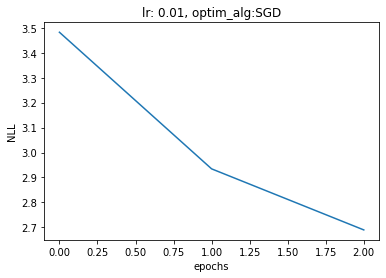

In [ ]:
# train loss

plot_loss(loss_list)

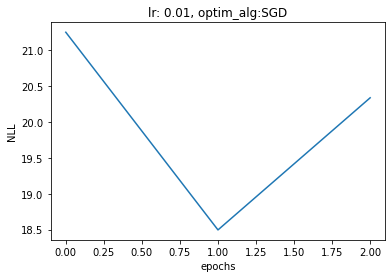

In [ ]:
# val loss
plot_loss(val_loss_list)

In [ ]:
trues, preds, test_loss_it_avg, test_loss_it, bleu_score = inference("test", test_loader, encoder1, attn_decoder1,VOC_enfr, None, langorder, max_length = maxlen)
print(bleu_score)

test:: 100%|██████████| 12448/12448 [01:37<00:00, 127.41it/s]


test : (loss 0.0) (blue BLEU = 0.00 100.0/100.0/0.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 2 ref_len = 2))
BLEU = 0.00 100.0/100.0/0.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 2 ref_len = 2)


In [ ]:
pairs = []
for i in range(len(enSentences)-1):
  pairs.append([enSentences[i], frSentences[i]])

In [ ]:
def evaluateRandomly(encoder, decoder, n=10):
    for i in range(n):
        pair = random.choice(pairs)
        print('>', pair[0])
        print('=', pair[1])
        output_words, attentions = evaluate(encoder, decoder,pair[0], input_lang='en', target_lang='fr', VOC=VOC_enfr)
        output_sentence = ' '.join(output_words)
        print('<', output_sentence)
        print('')

In [ ]:
evaluateRandomly(encoder1, attn_decoder1)

> we should continue to work on it therefore
= nous devrions donc continuer a y travailler
[2, 13, 163, 164, 21, 88, 64, 8, 555, 3]
< <sos> il y y contribue passe <EOS>

> accordingly i have voted against this resolution on the stabilisation and association agreement with albania on the grounds that it represents a first step and let us not labour under any misconceptions here towards albanian accession and europe as in the case of turkey chooses to ignore the opinion of its public
= jai donc vote contre cette resolution sur laccord de stabilisation et dassociation avec lalbanie parce quelle constitue une premiere etape ne nous faisons pas dillusions a ce sujet vers ladhesion de lalbanie et leurope comme dans le cas de la turquie choisit dignorer lopinion de sa population
[2, 4248, 58, 148, 1997, 506, 49, 251, 64, 6, 10393, 203, 3784, 877, 132, 11225, 64, 6, 2925, 46, 8, 654, 31, 139, 178, 203, 260, 104, 15, 858, 455, 144, 11959, 109, 1844, 10290, 2645, 203, 187, 320, 39, 6, 10, 5, 377

Test on text

In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je fais de la traduction.", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 2598, 5, 6, 8298, 0, 3]
<sos> i am very pleased <EOS>


5 epochs

In [ ]:
epochs = 5
hidden_size = 256
langorder = ['en', 'fr']
encoder1 = EncoderRNN(VOC_enfr[langorder[0]]['nbwords'], hidden_size).to(device)
attn_decoder1 = AttnDecoderRNN(hidden_size, VOC_enfr[langorder[1]]['nbwords'], dropout_p=0.1).to(device)
loss_list, val_loss_list = run_epochs(encoder1, attn_decoder1, VOC_enfr, epochs, learning_rate=0.01, langorder=langorder, max_length = maxlen)

Epoch 0:: 100%|██████████| 50542/50542 [18:53<00:00, 44.58it/s]


Epoch 0 : Training : (loss 3.7897771789905073) 


validation:: 100%|██████████| 12447/12447 [02:09<00:00, 96.45it/s] 


validation : (loss 21.26163196366475) (blue BLEU = 0.00 100.0/50.0/50.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 3 ref_len = 3))


Epoch 1:: 100%|██████████| 50542/50542 [18:41<00:00, 45.08it/s]


Epoch 1 : Training : (loss 3.152819162058975) 


validation:: 100%|██████████| 12447/12447 [02:06<00:00, 98.63it/s] 


validation : (loss 19.319300103803403) (blue BLEU = 100.00 100.0/100.0/100.0/100.0 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


Epoch 2:: 100%|██████████| 50542/50542 [18:42<00:00, 45.04it/s]


Epoch 2 : Training : (loss 2.862348014624877) 


validation:: 100%|██████████| 12447/12447 [02:05<00:00, 98.96it/s] 


validation : (loss 19.091957127248417) (blue BLEU = 47.29 80.0/75.0/33.3/25.0 (BP = 1.000 ratio = 1.000 hyp_len = 5 ref_len = 5))


Epoch 3:: 100%|██████████| 50542/50542 [18:44<00:00, 44.93it/s]


Epoch 3 : Training : (loss 2.6569712848072577) 


validation:: 100%|██████████| 12447/12447 [02:02<00:00, 101.20it/s]


validation : (loss 17.550696202954022) (blue BLEU = 100.00 100.0/100.0/100.0/100.0 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


Epoch 4:: 100%|██████████| 50542/50542 [18:46<00:00, 44.87it/s]


Epoch 4 : Training : (loss 2.4951557790699) 


validation:: 100%|██████████| 12447/12447 [02:09<00:00, 96.10it/s]


validation : (loss 20.836403642440366) (blue BLEU = 63.89 100.0/100.0/50.0/33.3 (BP = 1.000 ratio = 1.000 hyp_len = 6 ref_len = 6))


In [ ]:
torch.save(encoder1.state_dict(), 'encoder40_5ep.dict')
torch.save(attn_decoder1.state_dict(), 'decoder40_5ep.dict')
from google.colab import files
files.download('encoder40_5ep.dict')
files.download('decoder40_5ep.dict')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

def plot_loss(loss_list,val_loss_list):
  '''
  This function creates a plot. a simple curve showing the different values at each steps.
  Here we use it to plot the loss so we named it plot_loss, but the same function with different titles could be used to plot accuracies
  or other metrics for instance.
 
  Args:
    loss_list (list of floats): list of numerical values
  '''
  plt.plot(range(len(loss_list)), loss_list,  label='loss', color = 'r')
  plt.plot(range(len(val_loss_list)), val_loss_list, label = 'validation loss', color = 'b')
  plt.xlabel('epochs')
  plt.ylabel('NLL')
  plt.title('lr: {}, optim_alg:{}'.format(0.01, 'SGD'))
  plt.legend()
  plt.show()


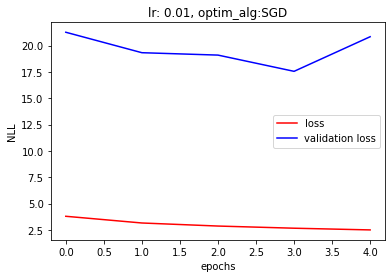

In [ ]:
plot_loss(loss_list, val_loss_list)

In [ ]:
trues, preds, test_loss_it_avg, test_loss_it, bleu_score = inference("test", test_loader, encoder1, attn_decoder1,VOC_enfr, None, langorder, max_length = maxlen)
print(bleu_score)

test:: 100%|██████████| 12448/12448 [01:35<00:00, 129.69it/s]


test : (loss 0.0) (blue BLEU = 0.00 100.0/100.0/50.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 3 ref_len = 3))
BLEU = 0.00 100.0/100.0/50.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 3 ref_len = 3)


In [ ]:
evaluateRandomly(encoder1, attn_decoder1)

> the use of any products of animal origin must be clearly shown on the label of the textile product
= lutilisation de tout produit dorigine animale doit etre clairement indiquee sur letiquette du produit textile
[2, 6, 1170, 5, 144, 658, 5, 2869, 2862, 369, 55, 1309, 2071, 64, 6, 5995, 5, 6, 10151, 1354, 3]
< <sos> la du de nexiste juridique passe me tous <EOS>

> my political group has done this and we believe that even with the technologies currently available we should support mr tabajdis report
= mon groupe politique sy est prete et nous pensons que meme en letat actuel des technologies dont nous disposons il convient de soutenir le rapport de m tabajdi
[2, 36, 214, 26, 89, 225, 49, 203, 13, 234, 46, 1117, 132, 6, 11555, 1400, 2948, 13, 163, 261, 29, 0, 67, 3]
< <sos> la sagit sagit pse pse de <EOS>

> however thanks to persistence and determination on all sides these negotiations were conducted in a thorough efficient and transparent manner and i think that i speak for everyone i

In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"i am going to the commission", input_lang='en', target_lang='fr', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 58, 217, 274, 21, 6, 275, 3]
<sos> je vais la commission a la commission <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"i am going to the european parliament", input_lang='en', target_lang='fr', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 58, 217, 274, 21, 6, 976, 238, 3]
<sos> je suis au parlement europeen <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je vais au parlement", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 441, 110, 238, 3]
<sos> i will to <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"il sagit de quelque chose de nouveau", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 8, 9, 5, 866, 236, 5, 994, 3]
<sos> this is a new of <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je ne comprends pas ce que vous dites", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 15, 802, 17, 18, 57, 62, 417, 3]
<sos> i do not understand you understand that <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je traduis des phrases", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 0, 23, 17161, 3]
<sos> i am just <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je vais au parlement", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 441, 110, 238, 3]
<sos> i will to <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"la session va reprendre", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 6, 7, 432, 3225, 3]
<sos> the current goes is <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"i am going to the commission", input_lang='en', target_lang='fr', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 58, 217, 274, 21, 6, 275, 3]
<sos> pse y contribue <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"il sagit de quelque chose de nouveau", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 8, 9, 5, 866, 236, 5, 994, 3]
<sos> this is a new of <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je ne comprends pas ce que vous dites", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 15, 802, 17, 18, 57, 62, 417, 3]
<sos> i do not understand you understand that <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"la session va reprendre", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 6, 7, 432, 3225, 3]
<sos> the current goes is <EOS>


Some sentences that we write ourselves seem to be well translated but there is remaining work to improve it.

## Visualizing attentions 

Modify the evaluate function so that it gives us the decoder_attentions as an output

In [ ]:
def sentence2tensor(entry, lang,VOC):
  """
  Function to transform an entry sentence into its corresponding indices as a tensor. 
  Needs to indicate the language to select the correct part of the vocabulary 
  Args : 
    - entry : sentences 
    - lang : language 
    - VOC : vocabulary
  """
  indices = [SOS_IDX] + [ VOC[lang]['stoi'][t] if t in VOC[lang]['stoi'] else 0 for t in tok.tokenize(entry.lower().strip()) ] + [EOS_IDX]
  print(indices)
  return torch.tensor(indices)

def evaluate(encoder, decoder, sentence, input_lang, target_lang, VOC, max_length=maxlen, input_tensor=None, target_tensor=None, criterion=None):
    """
    function to evaluate a translation of one sentence
    Args : 
      - encoder : the encoder
      - decoder : the decoder
      - sentence : sentences of a dataset
      - input_lang : the input language ( french or english)
      - target_lang : output language ( french or english)
      - VOC : vocabulary of the dataset 
    """
    # we evaluate, so we don't need gradients -> torch.no_grad()
    with torch.no_grad():
        
        if target_tensor is None: target_length = 0
        else: target_length = target_tensor.size(0)

        encoder_hidden = encoder.initHidden()
        
        # this condition adapts the function to either use a sentence as input, or a tensor
        if input_tensor is None:
          input_tensor = sentence2tensor(sentence, input_lang,VOC)
          # adapts the decoding length, useful for validation or test
          decoding_length = max_length
        else:
          decoding_length = target_length
        
        input_length = input_tensor.size(0)

        encoder_outputs = torch.zeros(max_length, encoder.hidden_size, device=device)

        # iterate through the input length 
        for ei in range(input_length):
            if ei >= max_length: break
            encoder_output, encoder_hidden = encoder(input_tensor[ei], encoder_hidden)
            encoder_outputs[ei] += encoder_output[0, 0]

        decoder_input = torch.tensor([[SOS_IDX]], device=device)  # SOS

        decoder_hidden = encoder_hidden

        decoded_words = []
        decoder_attentions = torch.zeros(max_length, max_length)
        
        # init the loss (the loss is important is the cirterion is given - i.e. validation phase)
        loss = 0

        # iterate through decoding values, feeding the output for the next token until the condition or maximum lenght is reached
        for di in range(decoding_length):
            #decoder_output, decoder_hidden = decoder(decoder_input, decoder_hidden)
            decoder_output, decoder_hidden, decoder_attention = decoder(
                decoder_input, decoder_hidden, encoder_outputs)
            decoder_attentions[di] = decoder_attention.data
            topv, topi = decoder_output.data.topk(1)
            if topi.item() == EOS_IDX:
                decoded_words.append('<EOS>')
                break
            else:
                decoded_words.append(VOC[target_lang]['itos'][topi.item()])

            decoder_input = topi.squeeze().detach()

            if target_tensor != None and criterion is not None:
              loss += criterion(decoder_output.to(device), target_tensor[di].unsqueeze(0).to(device))
              if decoder_input.item() == EOS_IDX:
                break

        return decoded_words, decoder_attentions[:di + 1]

In [ ]:
def inference(target, loader, encoder, decoder,VOC, criterion, langorder, limit=0, max_length = maxlen):
  """
  fucntion to apply the inference logic over multiple translation and return a score
  used for validation
  """
  encoder.eval()
  decoder.eval()
  loss_it, glue_it = list(), list()
  preds, trues = list(), list()

  total = loader.__len__()
  if limit > 0: total = limit

  # iterate through the loader, can be a validation or test loader
  for it, batch in tqdm(enumerate(loader), desc="%s:" % (target), total=total):
    
    if limit > 0 and it >= limit: break

    input_tensor = batch[langorder[0]].squeeze()
    target_tensor = batch[langorder[1]].squeeze()

    input_lang = langorder[0]
    target_lang = langorder[1]
    # dummy sentence because this function is used for validation, not on-demand test
    mock_sentence = "dummy sentence not used"

    # compute entry and target sentences as "real text"
    entry = [VOC[input_lang]['itos'][t] for t in input_tensor.tolist()]
    entry = ' '.join( [e for e in entry if e not in ['<pad>', '<sos>', '<eos>', '<EOS>']] )
    true =  [VOC[target_lang]['itos'][t] for t in target_tensor.tolist()]
    true = ' '.join( [r for r in true if r not in ['<pad>', '<sos>', '<eos>', '<EOS>']] )
    trues.append([true])

    pred, loss = evaluate(encoder, decoder, mock_sentence, input_lang, target_lang,VOC, input_tensor=input_tensor, target_tensor=target_tensor, criterion=criterion,max_length = maxlen )
    pred = ' '.join( [ h for h in pred if h not in ['<pad>', '<sos>', '<eos>', '<EOS>'] ] )
    preds.append(pred)
    if criterion is not None: 
      try:
        loss_it.append(loss.item())
      except: pass
    else: loss_it.append(loss)

  bleu = BLEU()
  bleu_score = bleu.corpus_score(preds, trues)
  try:
    loss_it_avg = sum(loss_it)/len(loss_it)
  except ZeroDivisionError:
    loss_it_avg =0
  

  #loss_it_avg = sum(loss_it)/len(loss_it)

  print("%s : (%s %s) (%s %s)" % ( colored(target, 'blue'), colored('loss', 'cyan'), loss_it_avg, colored('blue', 'cyan'), bleu_score ))

  return trues, preds, loss_it_avg, loss_it, bleu_score 

In [ ]:
epochs = 3
hidden_size = 256
langorder = ['fr', 'en']
encoder1 = EncoderRNN(VOC_enfr[langorder[0]]['nbwords'], hidden_size).to(device)
attn_decoder1 = AttnDecoderRNN(hidden_size, VOC_enfr[langorder[1]]['nbwords'], dropout_p=0.1).to(device)
loss_list, val_loss_list = run_epochs(encoder1, attn_decoder1, VOC_enfr, epochs, learning_rate=0.01, langorder=langorder, max_length = maxlen)

Epoch 0:: 100%|██████████| 50542/50542 [15:37<00:00, 53.90it/s]


Epoch 0 : Training : (loss 3.473235475567453) 


validation:: 100%|██████████| 12447/12447 [01:43<00:00, 120.78it/s]


validation : (loss 0) (blue BLEU = 70.71 100.0/100.0/75.0/33.3 (BP = 1.000 ratio = 1.000 hyp_len = 6 ref_len = 6))


Epoch 1:: 100%|██████████| 50542/50542 [15:42<00:00, 53.60it/s]


Epoch 1 : Training : (loss 2.9305537489462563) 


validation:: 100%|██████████| 12447/12447 [01:42<00:00, 121.80it/s]


validation : (loss 0) (blue BLEU = 21.02 75.0/16.7/12.5/12.5 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


Epoch 2:: 100%|██████████| 50542/50542 [15:46<00:00, 53.38it/s]


Epoch 2 : Training : (loss 2.6951817177024187) 


validation:: 100%|██████████| 12447/12447 [01:44<00:00, 119.66it/s]


validation : (loss 0) (blue BLEU = 74.01 80.0/75.0/100.0/50.0 (BP = 1.000 ratio = 1.000 hyp_len = 5 ref_len = 5))


In [ ]:
# Save and download to github
torch.save(encoder1.state_dict(), 'encoder40attn.dict')
torch.save(attn_decoder1.state_dict(), 'decoder40attn.dict')
from google.colab import files
files.download('encoder40attn.dict')
files.download('decoder40attn.dict')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
evaluateRandomly(encoder1, attn_decoder1)

> there are already signs that quite a few big companies will be removing these allergens from their cosmetics
= des signes indiquent deja que de tres nombreuses grandes entreprises sont desireuses de ne plus utiliser ces substances allergenes dans les cosmetiques
[2, 41, 95, 324, 5498, 46, 674, 31, 766, 873, 301, 79, 55, 13826, 206, 0, 24, 736, 6565, 3]
< <sos> pib la la la nont la aujourdhui la <EOS>

> in the recent past the irish authorities were willing to provide the public with copies of reasoned opinions on request but the commission understands that they are no longer willing to do so
= il ny a pas longtemps les autorites irlandaises voulaient donner a la population sur demande des copies des avis motives mais la commission croit comprendre quelles ne veulent plus le faire
[2, 39, 6, 1167, 528, 6, 4398, 8459, 161, 2033, 21, 3112, 6, 1681, 132, 0, 5, 0, 1323, 64, 183, 112, 6, 275, 3834, 46, 110, 95, 42, 280, 2033, 21, 14, 129, 3]
< <sos> une parait contraire expliquer passe la 

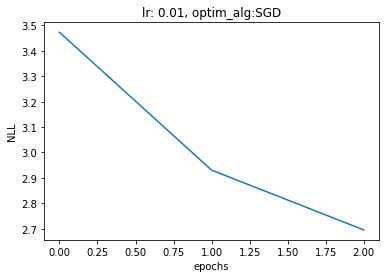

In [ ]:
plot_loss(loss_list)

In [ ]:
import matplotlib.pyplot as plt

[2, 4898, 0, 775, 5973, 0, 0, 3]


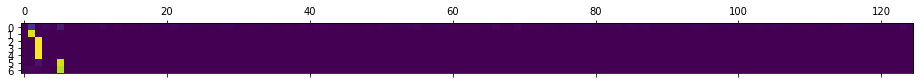

In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je fais de la traduction.", input_lang='en', target_lang='fr', VOC=VOC_enfr)
plt.matshow(attentions.numpy())

[2, 162, 85, 223, 224, 5, 2464, 57, 1047, 0, 3]
input = elle a cinq ans de moins que moi .
output = <sos> it were a to to me for years <EOS>


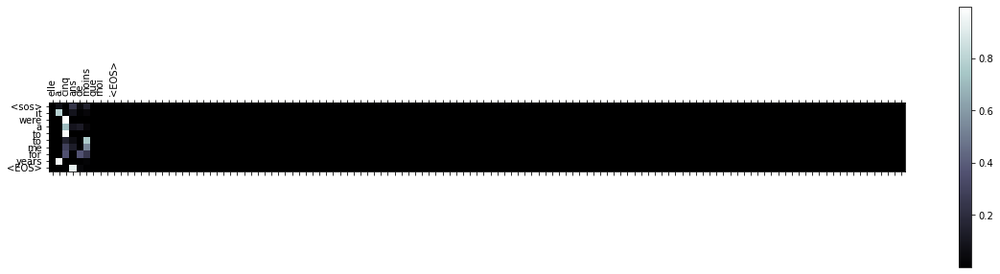

In [ ]:
import matplotlib.ticker as ticker
def showAttention(input_sentence, output_words, attentions):
    # Set up figure with colorbar
    fig = plt.figure(figsize=(20,5))
    
    ax = fig.add_subplot(111)
    cax = ax.matshow(attentions.numpy(), cmap='bone')
    fig.colorbar(cax)

    # Set up axes
    ax.set_xticklabels([''] + input_sentence.split(' ') +
                       ['<EOS>'], rotation=90)
    ax.set_yticklabels([''] + output_words)

    # Show label at every tick
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    plt.show()


def evaluateAndShowAttention(input_sentence):
    output_words, attentions = evaluate(encoder1, attn_decoder1,input_sentence, input_lang='fr', target_lang='en', VOC=VOC_enfr)
    #evaluate(
    #    encoder1, attn_decoder1, input_sentence)
    print('input =', input_sentence)
    print('output =', ' '.join(output_words))
    showAttention(input_sentence, output_words, attentions)


evaluateAndShowAttention("elle a cinq ans de moins que moi .")


[2, 162, 36, 565, 1603, 0, 3]
input = elle est trop petit .
output = <sos> it is the too the <EOS>


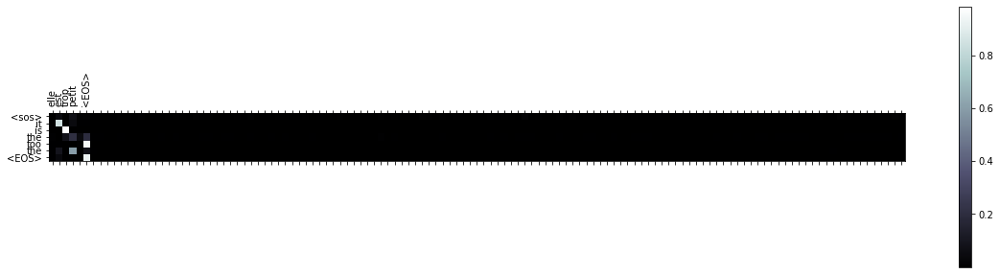

In [ ]:
evaluateAndShowAttention("elle est trop petit .")

[2, 238, 0, 0, 3]
input = parlement européen .
output = <sos> parliament approved <EOS>


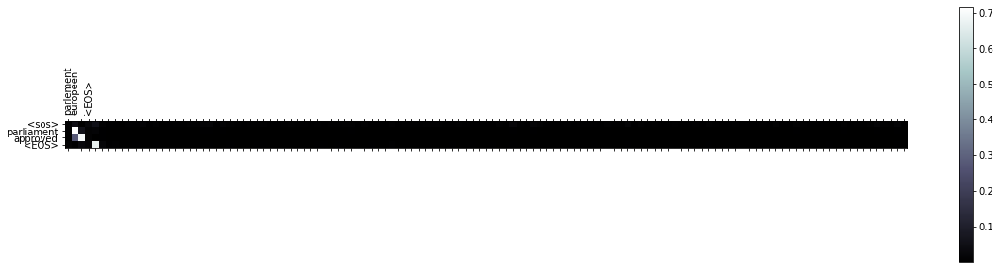

In [ ]:
evaluateAndShowAttention("parlement européen .")

[2, 385, 283, 238, 3]
input = commission et parlement
output = <sos> parliament and parliament <EOS>


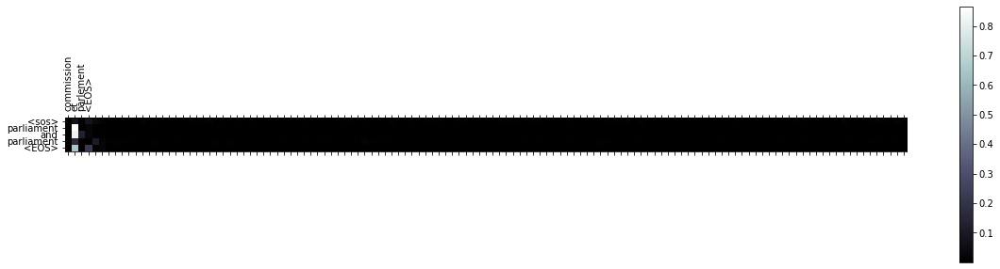

In [ ]:
evaluateAndShowAttention("commission et parlement")

In [ ]:
evaluateAndShowAttention("reprise de la session")

In [ ]:
epochs = 5
hidden_size = 256
langorder = ['fr', 'en']
encoder1 = EncoderRNN(VOC_enfr[langorder[0]]['nbwords'], hidden_size).to(device)
attn_decoder1 = AttnDecoderRNN(hidden_size, VOC_enfr[langorder[1]]['nbwords'], dropout_p=0.1).to(device)
loss_list, val_loss_list = run_epochs(encoder1, attn_decoder1, VOC_enfr, epochs, learning_rate=0.01, langorder=langorder, max_length = maxlen)

Epoch 0:: 100%|██████████| 50542/50542 [15:55<00:00, 52.91it/s]


Epoch 0 : Training : (loss 3.479226012897833) 


validation:: 100%|██████████| 12447/12447 [01:41<00:00, 122.56it/s]


validation : (loss 0) (blue BLEU = 0.00 100.0/50.0/50.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 3 ref_len = 3))


Epoch 1:: 100%|██████████| 50542/50542 [16:06<00:00, 52.31it/s]


Epoch 1 : Training : (loss 2.9251600675993705) 


validation:: 100%|██████████| 12447/12447 [01:43<00:00, 120.53it/s]


validation : (loss 0) (blue BLEU = 0.00 100.0/100.0/100.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 3 ref_len = 3))


Epoch 2:: 100%|██████████| 50542/50542 [16:16<00:00, 51.77it/s]


Epoch 2 : Training : (loss 2.6809136733336576) 


validation:: 100%|██████████| 12447/12447 [01:45<00:00, 117.97it/s]


validation : (loss 0) (blue BLEU = 70.71 100.0/100.0/50.0/50.0 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


Epoch 3:: 100%|██████████| 50542/50542 [16:12<00:00, 51.97it/s]


Epoch 3 : Training : (loss 2.5206830096555155) 


validation:: 100%|██████████| 12447/12447 [01:42<00:00, 121.53it/s]


validation : (loss 0) (blue BLEU = 0.00 100.0/50.0/0.0/0.0 (BP = 1.000 ratio = 1.000 hyp_len = 2 ref_len = 2))


Epoch 4:: 100%|██████████| 50542/50542 [15:59<00:00, 52.65it/s]


Epoch 4 : Training : (loss 2.3853270438483465) 


validation:: 100%|██████████| 12447/12447 [01:45<00:00, 117.78it/s]


validation : (loss 0) (blue BLEU = 45.18 100.0/66.7/25.0/25.0 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))


In [ ]:
torch.save(encoder1.state_dict(), 'encoder40best.dict')
torch.save(attn_decoder1.state_dict(), 'decoder40best.dict')
from google.colab import files
files.download('encoder40best.dict')
files.download('decoder40best.dict')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
evaluateRandomly(encoder1, attn_decoder1)

> this report has been discussed
= ce rapport a deja ete examine
[2, 49, 67, 89, 90, 1210, 3]
< <sos> la sagit il sagit passe <EOS>

> the eus relationship with pakistan is based on a commitment to democracy peace and stability trade and development and respect for human rights
= la relation de lunion avec le pakistan se fonde sur lengagement envers la democratie la paix et la stabilite le commerce et le developpement ainsi que le respect des droits de lhomme
[2, 6, 5930, 3354, 132, 3707, 9, 4070, 64, 31, 750, 21, 1154, 448, 203, 2348, 894, 203, 2180, 203, 497, 44, 892, 893, 3]
< <sos> la jai y contribue jai <EOS>

> the failure today inside and outside the eu to comply with basic international social standards constitutes a form of social and environmental dumping detrimental to both european enterprises and eu and noneu workers and citizens
= le nonrespect des normes sociales internationales de base auquel nous assistons aujourdhui au sein de lunion et en dehors constitue une forme d

[2, 162, 36, 565, 1603, 0, 3]
input = elle est trop petit .
output = <sos> it is too to be <EOS>


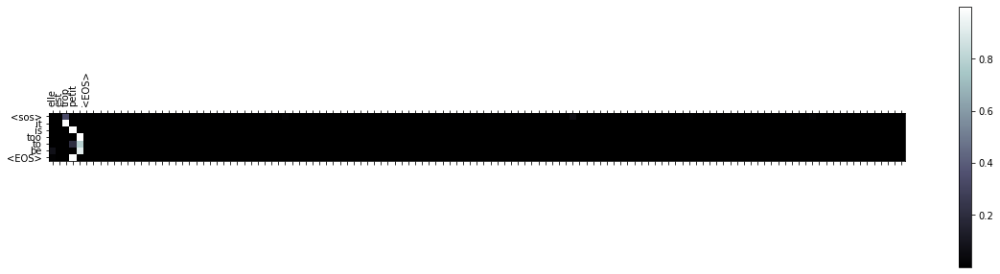

In [ ]:
import matplotlib.ticker as ticker
def showAttention(input_sentence, output_words, attentions):
    # Set up figure with colorbar
    fig = plt.figure(figsize=(20,5))
    
    ax = fig.add_subplot(111)
    cax = ax.matshow(attentions.numpy(), cmap='bone')
    fig.colorbar(cax)

    # Set up axes
    ax.set_xticklabels([''] + input_sentence.split(' ') +
                       ['<EOS>'], rotation=90)
    ax.set_yticklabels([''] + output_words)

    # Show label at every tick
    ax.xaxis.set_major_locator(ticker.MultipleLocator(1))
    ax.yaxis.set_major_locator(ticker.MultipleLocator(1))

    plt.show()


def evaluateAndShowAttention(input_sentence):
    output_words, attentions = evaluate(encoder1, attn_decoder1,input_sentence, input_lang='fr', target_lang='en', VOC=VOC_enfr)
    #evaluate(
    #    encoder1, attn_decoder1, input_sentence)
    print('input =', input_sentence)
    print('output =', ' '.join(output_words))
    showAttention(input_sentence, output_words, attentions)

evaluateAndShowAttention("elle est trop petit .")

[2, 61, 132, 239, 3]
input = je suis europeen
output = <sos> i am european <EOS>


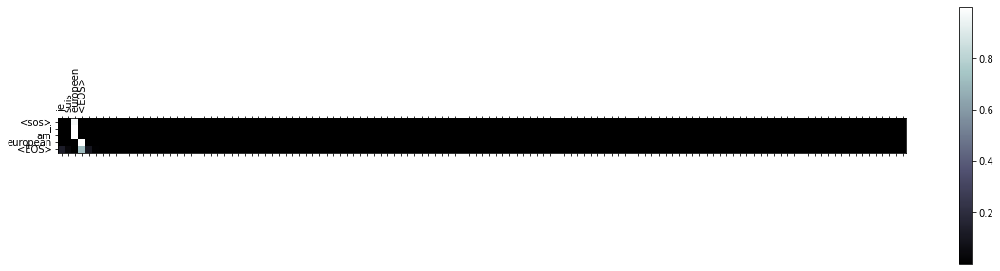

In [ ]:
evaluateAndShowAttention("je suis europeen")

In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je suis europeen", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 132, 239, 3]
<sos> i am european <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je vais à la commission", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 441, 0, 6, 385, 3]
<sos> i will commission to them <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"je traduis des phrases", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 61, 0, 23, 17161, 3]
<sos> i will to to <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"la femme parle beaucoup", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 6, 1336, 902, 38, 3]
<sos> the much many of the great deal <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"ce nest pas si mal", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 18, 180, 17, 544, 1752, 3]
<sos> it is not bad <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"cest trop long", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 53, 565, 669, 3]
<sos> that is long too long <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"la commission est aujourdhui", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 6, 385, 36, 306, 3]
<sos> the commission is today today <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"amendement", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 431, 3]
<sos> amendment no <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"aujourdhui", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 306, 3]
<sos> today today <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"ceci fonctionne assez bien", input_lang='fr', target_lang='en', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 101, 2375, 2062, 415, 3]
<sos> this is quite well well <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"parliament", input_lang='en', target_lang='fr', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 238, 3]
<sos> parlement de parlement <EOS>


In [ ]:
output_words, attentions = evaluate(encoder1, attn_decoder1,"i am not happy with the policy", input_lang='en', target_lang='fr', VOC=VOC_enfr)
output_sentence = ' '.join(output_words)
print(output_sentence)

[2, 58, 217, 15, 714, 132, 6, 141, 3]
<sos> pse rapidement pse pse <EOS>


## Test on another dataset : Tatoeba


In [ ]:
enfr

Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 75437
})

In [ ]:
tatoeba = load_dataset("tatoeba", lang1="en", lang2="fr",split='train')

Using custom data configuration en-fr-lang1=en,lang2=fr
Reusing dataset tatoeba (/root/.cache/huggingface/datasets/tatoeba/en-fr-lang1=en,lang2=fr/0.0.0/b3ea9c6bb2af47699c5fc0a155643f5a0da287c7095ea14824ee0a8afd74daf6)


In [ ]:
tatoeba

Dataset({
    features: ['id', 'translation'],
    num_rows: 264905
})

In [ ]:
tat = tatoeba['translation']
tat_d = {'translation': tat}

In [ ]:
tato =  Dataset.from_dict(tat_d)
tato

Dataset({
    features: ['translation'],
    num_rows: 264905
})

In [ ]:
tato2= tato[:75437]

In [ ]:
tato3 =  Dataset.from_dict(tato2)

In [ ]:
tato3

Dataset({
    features: ['translation'],
    num_rows: 75437
})

In [ ]:
UNK_IDX, PAD_IDX, SOS_IDX, EOS_IDX = 0, 1, 2, 3
special_symbols = ['<unk>', '<pad>', '<sos>', '<eos>']

VOC_tatoeba = {'en': {'stoi': {}, 'counts': {}, 'nbwords': 0}, 'fr': {'stoi': {}, 'counts': {}, 'nbwords': 0}}

build_vocabulary(VOC_tatoeba,tato3)

100%|██████████| 75437/75437 [00:11<00:00, 6631.06it/s]


In [ ]:
tato3 = tato3.map(lambda e: prepa(e,VOC_tatoeba), batched=True)

  0%|          | 0/76 [00:00<?, ?ba/s]

In [ ]:
tato3

Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 75437
})

In [ ]:
maxlen_tot = max([max([ len(e) for e in tato3['en'] ]), max([ len(e) for e in tato3['fr'] ]) ] )
maxlen_tot

117

In [ ]:
tatoeba_train, tatoeba_test, tatoeba_val = train_test_val_split (tato3)

In [ ]:
print(tatoeba_train)
print(tatoeba_test)
print(tatoeba_test)

Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 50542
})
Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 12448
})
Dataset({
    features: ['translation', 'fr', 'en'],
    num_rows: 12448
})


In [ ]:
from torch.utils.data import DataLoader
train_loader = DataLoader(EnfrDataset(tatoeba_train), batch_size=1, shuffle=True, drop_last=True)
val_loader   = DataLoader(EnfrDataset(tatoeba_val), batch_size=1, shuffle=True, drop_last=True)
test_loader  = DataLoader(EnfrDataset(tatoeba_test), batch_size=1, shuffle=True, drop_last=True)

In [ ]:
l_tat = tato3['translation']

In [ ]:
l_tat[:2]

[{'en': 'When he asked who had broken the window, all the boys put on an air of innocence.',
  'fr': "Lorsqu'il a demandé qui avait cassé la fenêtre, tous les garçons ont pris un air innocent."},
 {'en': 'Then, when he asked who had broken the window, all the boys acted innocent.',
  'fr': "Lorsqu'il a demandé qui avait cassé la fenêtre, tous les garçons ont pris un air innocent."}]

In [ ]:
english = []
french = []
for di in l_tat:
  english.append(di['en'])
  french.append(di['fr'])

In [ ]:
df_tot = pd.DataFrame(english,columns=['English'])
df_tot['French'] = french

In [ ]:
df_tot.head()

,English,French
0,"When he asked who had broken the window, all t...",Lorsqu'il a demandé qui avait cassé la fenêtre...
1,"Then, when he asked who had broken the window,...",Lorsqu'il a demandé qui avait cassé la fenêtre...
2,Let's try something.,Essayons quelque chose !
3,Let's try something.,Tentons quelque chose !
4,Let's try something.,Essayons quelque chose.


In [ ]:
df_tot = df_tot[:10000]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [ ]:
text = " ".join(review for review in df_tot.English)
print ("There are {} words in the combination of all review.".format(len(text)))

There are 371437 words in the combination of all review.


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

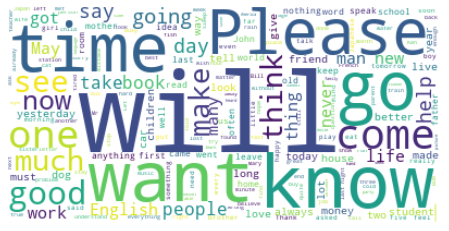

In [ ]:
# Create stopword list:
stopwords = set(STOPWORDS)

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(15,4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
from nltk.corpus import stopwords
text = " ".join(review for review in df_tot.French)
print ("There are {} words in the combination of all review.".format(len(text)))

There are 426320 words in the combination of all review.


In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

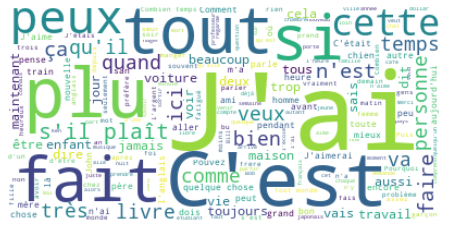

In [ ]:
# Create stopword list:
stopwords = set(stopwords.words('french'))

# Generate a word cloud image
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(15,4))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
trues, preds, test_loss_it_avg, test_loss_it, bleu_score = inference("test", test_loader, encoder1, attn_decoder1,VOC_tatoeba, None, langorder, max_length = maxlen)
print(bleu_score)

test:: 100%|██████████| 165/165 [00:02<00:00, 58.89it/s]

test : (loss 0.0) (blue BLEU = 9.65 33.3/10.0/6.2/4.2 (BP = 1.000 ratio = 1.000 hyp_len = 6 ref_len = 6))
BLEU = 9.65 33.3/10.0/6.2/4.2 (BP = 1.000 ratio = 1.000 hyp_len = 6 ref_len = 6)


We can see that the bleu score is very bad

In [ ]:
pairs = []
for i in range(len(english)-1):
  pairs.append([english[i], french[i]])

In [ ]:
evaluateRandomly(encoder1, attn_decoder1)

> He knows a lot about animals.
= Il en sait beaucoup sur les animaux.
[2, 507, 585, 31, 32, 365, 3747, 0, 3]
< <sos> sembletil lieu du groupe groupe lieu pour <EOS>

> The old man caught a big fish.
= Le vieil homme attrapa un gros poisson.
[2, 6, 718, 539, 8711, 31, 873, 2873, 0, 3]
< <sos> de la heures groupe groupe du reprise de <EOS>

> She attended on her sick husband.
= Elle soignait son époux malade.
[2, 1545, 9335, 64, 1424, 8458, 4145, 0, 3]
< <sos> mercredi formule formule groupe groupe du du <EOS>

> That is no business of his.
= Ce ne sont pas ses oignons.
[2, 46, 9, 42, 874, 5, 65, 0, 3]
< <sos> nont certain loin de ortega pays <EOS>

> Many young girls like that singer.
= Beaucoup de jeunes filles aiment ce chanteur.
[2, 209, 2072, 5577, 105, 46, 0, 0, 3]
< <sos> minorite nont groupe groupe groupe realisable realisable <EOS>

> He came back not because he was homesick, but because he was running short of money.
= Il est revenu non-pas parce qu'il avait le mal du pays, ma

# Transfert learning

## Install

In [ ]:
! pip install datasets transformers sacrebleu torch sentencepiece transformers[sentencepiece]

     |████████████████████████████████| 325 kB 5.2 MB/s 
     |████████████████████████████████| 4.0 MB 61.5 MB/s 
     |████████████████████████████████| 90 kB 8.3 MB/s 
     |████████████████████████████████| 1.2 MB 43.5 MB/s 
     |████████████████████████████████| 136 kB 60.8 MB/s 
     |████████████████████████████████| 212 kB 54.2 MB/s 
     |████████████████████████████████| 1.1 MB 52.9 MB/s 
     |████████████████████████████████| 77 kB 6.6 MB/s 
     |████████████████████████████████| 127 kB 58.1 MB/s 
     |████████████████████████████████| 6.6 MB 36.9 MB/s 
     |████████████████████████████████| 895 kB 63.5 MB/s 
     |████████████████████████████████| 596 kB 23.5 MB/s 
     |████████████████████████████████| 271 kB 55.8 MB/s 
     |████████████████████████████████| 94 kB 4.0 MB/s 
     |████████████████████████████████| 144 kB 55.1 MB/s 
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully unins

## Import

In [ ]:
import os
os.environ["WANDB_DISABLED"]="true"
import transformers
from transformers import AutoTokenizer
from google.colab import files
from sklearn.model_selection import train_test_split
import datasets
from datasets import load_dataset
from datasets import DatasetDict,load_metric
import random
import pandas as pd
import numpy as np
from IPython.display import display, HTML
from transformers import MarianMTModel, MarianTokenizer
from transformers import AutoModelForSeq2SeqLM, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer
from transformers import MBart50TokenizerFast
from transformers import AutoTokenizer
from transformers import T5Tokenizer, T5ForConditionalGeneration
print(transformers.__version__)

4.18.0


## Load dataset

In [ ]:
!wget https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/enfr40.json

--2022-04-24 13:38:17--  https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/enfr40.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7043212 (6.7M) [text/plain]
Saving to: ‘enfr40.json’

enfr40.json         100%[===================>]   6.72M  --.-KB/s    in 0.1s    

2022-04-24 13:38:17 (67.7 MB/s) - ‘enfr40.json’ saved [7043212/7043212]



In [ ]:
dataset = load_dataset('json', data_files='enfr40.json',split='train')

Using custom data configuration default-53b688f5353c736d


Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Dataset json downloaded and prepared to /root/.cache/huggingface/datasets/json/default-53b688f5353c736d/0.0.0/ac0ca5f5289a6cf108e706efcf040422dbbfa8e658dee6a819f20d76bb84d26b. Subsequent calls will reuse this data.


In [ ]:
dataset

Dataset({
    features: ['translation'],
    num_rows: 75437
})

In [ ]:
def train_test_val_split (dataset) : 
  '''
  This function split a dataset in train, test and validation sub dataset
  Args : 
    - dataset : dataset to split
  '''
  indices = [i for i in range(len(dataset))]
  # use scikit learn to split the indices into subsets: ~67% train, ~16 % val, ~16% test
  train_indices, other_indices, _, _ = train_test_split(indices, indices, test_size=0.33, random_state=42)
  val_indices, test_indices, _, _ = train_test_split(other_indices, other_indices, test_size=0.5, random_state=42)
  train, test, val = dataset.select(train_indices), dataset.select(test_indices), dataset.select(val_indices)
  return train, test, val

train_dataset, test_dataset,val_dataset = train_test_val_split(dataset)

In [ ]:
raw_datasets = DatasetDict({
    "train":
        train_dataset,
    "validation":
        val_dataset,
    "test" :
        test_dataset
    
})
metric = load_metric("sacrebleu")

In [ ]:
raw_datasets

DatasetDict({
    train: Dataset({
        features: ['translation'],
        num_rows: 50542
    })
    validation: Dataset({
        features: ['translation'],
        num_rows: 12447
    })
    test: Dataset({
        features: ['translation'],
        num_rows: 12448
    })
})

In [ ]:
metric

Metric(name: "sacrebleu", features: {'predictions': Value(dtype='string', id='sequence'), 'references': Sequence(feature=Value(dtype='string', id='sequence'), length=-1, id='references')}, usage: """
Produces BLEU scores along with its sufficient statistics
from a source against one or more references.

Args:
    predictions (`list` of `str`): list of translations to score. Each translation should be tokenized into a list of tokens.
    references (`list` of `list` of `str`): A list of lists of references. The contents of the first sub-list are the references for the first prediction, the contents of the second sub-list are for the second prediction, etc. Note that there must be the same number of references for each prediction (i.e. all sub-lists must be of the same length).
    smooth_method (`str`): The smoothing method to use, defaults to `'exp'`. Possible values are:
        - `'none'`: no smoothing
        - `'floor'`: increment zero counts
        - `'add-k'`: increment num/deno

## Load models and pre-process

In [ ]:
model_name_marianMT="Helsinki-NLP/opus-mt-en-fr"
tokenizer_marianMT = AutoTokenizer.from_pretrained(model_name_marianMT)

model_name_t5 = "SEBIS/legal_t5_small_trans_fr_en"
tokenizer_t5 = AutoTokenizer.from_pretrained(model_name_t5,do_lower_case=False, skip_special_tokens=True)

Downloading:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.26k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/760k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/784k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.28M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/822 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/821k [00:00<?, ?B/s]

In [ ]:
tokenizer_marianMT(["Hello, this is an example!", "This is another example."])

{'input_ids': [[10537, 2, 67, 32, 77, 943, 145, 0], [160, 32, 1036, 943, 3, 0]], 'attention_mask': [[1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1]]}

In [ ]:
tokenizer_t5(["Hello, this is an example!", "This is another example."])

{'input_ids': [[435, 8564, 3, 168, 95, 112, 3370, 524, 1], [653, 95, 4556, 3370, 4, 1]], 'attention_mask': [[1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1]]}

In [ ]:
max_input_length = 128
max_target_length = 128
source_lang = "en"
target_lang = "fr"
def preprocess_function(examples,tokenizer, model_name):
  if model_name.split("/")[-1] in {'opus-mt-en-fr','mbart-large-50-one-to-many-mmt'} : prefix =""
  elif model_name.split("/")[-1] == "legal_t5_small_trans_fr_en" : prefix ="translate English to French:"
  else : return ('It is not an available model')
  inputs = [prefix + ex[source_lang] for ex in examples["translation"]]
  targets = [ex[target_lang] for ex in examples["translation"]]
  model_inputs = tokenizer(inputs, max_length=max_input_length, truncation=True)
  # Setup the tokenizer for targets
  with tokenizer.as_target_tokenizer():
      labels = tokenizer(targets, max_length=max_target_length, truncation=True)
  model_inputs["labels"] = labels["input_ids"]
  return model_inputs

In [ ]:
tokenized_datasets_marianMT = raw_datasets.map(preprocess_function, batched=True, fn_kwargs = dict(tokenizer = tokenizer_marianMT,model_name = model_name_marianMT) )
tokenized_datasets_t5 = raw_datasets.map(preprocess_function, batched=True, fn_kwargs = dict(tokenizer = tokenizer_t5,model_name = model_name_t5) )


  0%|          | 0/51 [00:00<?, ?ba/s]

  0%|          | 0/13 [00:00<?, ?ba/s]

  0%|          | 0/13 [00:00<?, ?ba/s]

  0%|          | 0/51 [00:00<?, ?ba/s]

  0%|          | 0/13 [00:00<?, ?ba/s]

  0%|          | 0/13 [00:00<?, ?ba/s]

In [ ]:
model_marianMT = AutoModelForSeq2SeqLM.from_pretrained(model_name_marianMT)
model_t5 = AutoModelForSeq2SeqLM.from_pretrained(model_name_t5)

Downloading:   0%|          | 0.00/287M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/231M [00:00<?, ?B/s]

In [ ]:
def args(model_name,batch_size = 16,learning_rate=2e-5,weight_decay=0.01,save_total_limit=3,num_train_epochs=1) : 
  model_short_name = model_name.split("/")[-1]
  args = Seq2SeqTrainingArguments(
      f"{model_short_name}-finetuned-{source_lang}-to-{target_lang}",
      evaluation_strategy = "epoch",
      learning_rate=learning_rate,
      per_device_train_batch_size=batch_size,
      per_device_eval_batch_size=batch_size,
      weight_decay=weight_decay,
      save_total_limit=save_total_limit,
      num_train_epochs=num_train_epochs,
      predict_with_generate=True    
    )
  return args

args_marianMT = args(model_name_marianMT,num_train_epochs=5)
args_t5 = args(model_name_t5,num_train_epochs=5)

Using the `WAND_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).
Using the `WAND_DISABLED` environment variable is deprecated and will be removed in v5. Use the --report_to flag to control the integrations used for logging result (for instance --report_to none).


In [ ]:
data_collator_marianMT = DataCollatorForSeq2Seq(tokenizer_marianMT, model=model_marianMT)
data_collator_t5= DataCollatorForSeq2Seq(tokenizer_t5, model=model_t5)

In [ ]:
def postprocess_text(preds, labels):
    preds = [pred.strip() for pred in preds]
    labels = [[label.strip()] for label in labels]
    return preds, labels
def compute_metrics(eval_preds):
    preds, labels = eval_preds
    if isinstance(preds, tuple):
        preds = preds[0]
    decoded_preds = tokenizer.batch_decode(preds, skip_special_tokens=True)
    # Replace -100 in the labels as we can't decode them.
    labels = np.where(labels != -100, labels, tokenizer.pad_token_id)
    decoded_labels = tokenizer.batch_decode(labels, skip_special_tokens=True)
    # Some simple post-processing
    decoded_preds, decoded_labels = postprocess_text(decoded_preds, decoded_labels)
    result = metric.compute(predictions=decoded_preds, references=decoded_labels)
    result = {"bleu": result["score"]}
    prediction_lens = [np.count_nonzero(pred != tokenizer.pad_token_id) for pred in preds]
    result["gen_len"] = np.mean(prediction_lens)
    result = {k: round(v, 4) for k, v in result.items()}
    return result

##Train models

In [ ]:
# Train T5 model
tokenizer = tokenizer_t5
trainer_t5= Seq2SeqTrainer(
    model_t5,
    args_t5,
    train_dataset=tokenized_datasets_t5['train'], 
    eval_dataset=tokenized_datasets_t5['validation'] ,
    data_collator=data_collator_t5,
    tokenizer=tokenizer_t5,
    compute_metrics=compute_metrics
)
trainer_t5.train()

The following columns in the training set  don't have a corresponding argument in `T5ForConditionalGeneration.forward` and have been ignored: translation. If translation are not expected by `T5ForConditionalGeneration.forward`,  you can safely ignore this message.
/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,
***** Running training *****
  Num examples = 50542
  Num Epochs = 5
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 15795


Epoch,Training Loss,Validation Loss,Bleu,Gen Len
1,4.079100,3.443078,7.148400,7.506500
2,3.583900,3.074600,9.812300,7.553900
3,3.328500,2.893467,11.253700,7.625600
4,3.195800,2.804461,11.955000,7.662500
5,3.145700,2.779895,12.166900,7.640100


Saving model checkpoint to legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500
Configuration saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500/config.json
Model weights saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500/pytorch_model.bin
tokenizer config file saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500/tokenizer_config.json
Special tokens file saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500/special_tokens_map.json
Copy vocab file to legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-500/spiece.model
Saving model checkpoint to legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-1000
Configuration saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-1000/config.json
Model weights saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-1000/pytorch_model.bin
tokenizer config file saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-1000/tokenizer_c

TrainOutput(global_step=15795, training_loss=3.632328712823233, metrics={'train_runtime': 1786.0734, 'train_samples_per_second': 141.489, 'train_steps_per_second': 8.843, 'total_flos': 1380399142993920.0, 'train_loss': 3.632328712823233, 'epoch': 5.0})

In [ ]:
trainer_t5.save_model()

Saving model checkpoint to legal_t5_small_trans_fr_en-finetuned-en-to-fr
Configuration saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/config.json
Model weights saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/pytorch_model.bin
tokenizer config file saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/tokenizer_config.json
Special tokens file saved in legal_t5_small_trans_fr_en-finetuned-en-to-fr/special_tokens_map.json
Copy vocab file to legal_t5_small_trans_fr_en-finetuned-en-to-fr/spiece.model


In [ ]:
!pwd

/content


In [ ]:
# Download model to github
path_to_files = '/content/legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-15500/'
for path,_,model_files in os.walk(path_to_files):
  for file in model_files: 
    files.download(path_to_files+file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
tokenizer = tokenizer_marianMT
trainer_marianMT = Seq2SeqTrainer(
    model_marianMT,
    args_marianMT,
    train_dataset=tokenized_datasets_marianMT['train'], 
    eval_dataset=tokenized_datasets_marianMT['validation'] ,
    data_collator=data_collator_marianMT,
    tokenizer=tokenizer_marianMT,
    compute_metrics=compute_metrics
)

trainer_marianMT.train()

The following columns in the training set  don't have a corresponding argument in `MarianMTModel.forward` and have been ignored: translation. If translation are not expected by `MarianMTModel.forward`,  you can safely ignore this message.
/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:309: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,
***** Running training *****
  Num examples = 50542
  Num Epochs = 5
  Instantaneous batch size per device = 16
  Total train batch size (w. parallel, distributed & accumulation) = 16
  Gradient Accumulation steps = 1
  Total optimization steps = 15795


Epoch,Training Loss,Validation Loss,Bleu,Gen Len
1,1.207500,1.124370,33.371900,8.137500
2,1.023600,1.078960,34.337600,8.144100
3,0.898100,1.067560,34.515900,8.137100
4,0.823800,1.064784,34.488800,8.136400
5,0.774100,1.066940,34.605100,8.142300


Saving model checkpoint to opus-mt-en-fr-finetuned-en-to-fr/checkpoint-500
Configuration saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-500/config.json
Model weights saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-500/pytorch_model.bin
tokenizer config file saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-500/tokenizer_config.json
Special tokens file saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-500/special_tokens_map.json
Saving model checkpoint to opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1000
Configuration saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1000/config.json
Model weights saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1000/pytorch_model.bin
tokenizer config file saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1000/tokenizer_config.json
Special tokens file saved in opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1000/special_tokens_map.json
Saving model checkpoint to opus-mt-en-fr-finetuned-en-to-fr/checkpoint-1500
Configuration saved i

TrainOutput(global_step=15795, training_loss=0.9706270165366438, metrics={'train_runtime': 3248.709, 'train_samples_per_second': 77.788, 'train_steps_per_second': 4.862, 'total_flos': 863600041525248.0, 'train_loss': 0.9706270165366438, 'epoch': 5.0})

In [ ]:
trainer_marianMT.save_model()

Saving model checkpoint to opus-mt-en-fr-finetuned-en-to-fr
Configuration saved in opus-mt-en-fr-finetuned-en-to-fr/config.json
Model weights saved in opus-mt-en-fr-finetuned-en-to-fr/pytorch_model.bin
tokenizer config file saved in opus-mt-en-fr-finetuned-en-to-fr/tokenizer_config.json
Special tokens file saved in opus-mt-en-fr-finetuned-en-to-fr/special_tokens_map.json


In [ ]:
# Dowload model to github
path_to_files = '/content/opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/'
for path,_,model_files in os.walk(path_to_files):
  for file in model_files: 
    files.download(path_to_files+file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##Compare models

###Blue metric

In [ ]:
!wget https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/decoder40best.dict
!wget https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/encoder40best.dict

--2022-04-24 15:20:13--  https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/decoder40best.dict
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31719439 (30M) [application/octet-stream]
Saving to: ‘decoder40best.dict’

decoder40best.dict  100%[===================>]  30.25M   184MB/s    in 0.2s    

2022-04-24 15:20:13 (184 MB/s) - ‘decoder40best.dict’ saved [31719439/31719439]

--2022-04-24 15:20:13--  https://raw.githubusercontent.com/LouiseBlart/Machine-Translation-NLP-2022/main/encoder40best.dict
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP reque

In [ ]:
hidden_size = 256
langorder = ['fr', 'en']

# instanciate the encoder
encoder = EncoderRNN(VOC_enfr[langorder[0]]['nbwords'], hidden_size).to(device)
# instanciate the decoder
attn_decoder = AttnDecoderRNN(hidden_size, VOC_enfr[langorder[1]]['nbwords'], dropout_p=0.1).to(device)

encoder.load_state_dict(torch.load('encoder40best.dict'))
attn_decoder.load_state_dict(torch.load('decoder40best.dict'))

<All keys matched successfully>

In [ ]:
langorder = ['en','fr']
trues, preds, test_loss_it_avg, test_loss_it, bleu_score = inference("test", test_loader, encoder, attn_decoder,VOC_enfr, None, langorder, max_length = maxlen)
print(bleu_score)

test:: 100%|██████████| 12448/12448 [01:39<00:00, 125.18it/s]


test : (loss 0.0) (blue BLEU = 19.00 50.0/16.7/12.5/12.5 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4))
BLEU = 19.00 50.0/16.7/12.5/12.5 (BP = 1.000 ratio = 1.000 hyp_len = 4 ref_len = 4)


In [ ]:
trainer_t5.evaluate(tokenized_datasets_t5['test'])

The following columns in the evaluation set  don't have a corresponding argument in `T5ForConditionalGeneration.forward` and have been ignored: translation. If translation are not expected by `T5ForConditionalGeneration.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 12448
  Batch size = 16


{'epoch': 5.0,
 'eval_bleu': 11.3841,
 'eval_gen_len': 20.0,
 'eval_loss': 2.791175127029419,
 'eval_runtime': 121.5942,
 'eval_samples_per_second': 102.373,
 'eval_steps_per_second': 6.398}

In [ ]:
trainer_marianMT.evaluate(tokenized_datasets_marianMT['test'])

The following columns in the evaluation set  don't have a corresponding argument in `MarianMTModel.forward` and have been ignored: translation. If translation are not expected by `MarianMTModel.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 12448
  Batch size = 16


{'epoch': 5.0,
 'eval_bleu': 34.3401,
 'eval_gen_len': 8.1373,
 'eval_loss': 1.0733574628829956,
 'eval_runtime': 321.8569,
 'eval_samples_per_second': 38.676,
 'eval_steps_per_second': 2.417}

The blue score is at 11 for T5 model, 19 for our model and 34 for marianMT model. So we can see that the pre-trained and fine-tuned marianMT model is better than our model and T5 model.

### With few sentences

In [ ]:
src_text_test_en = []
src_text_test_fr = []
for i in range(5) :
  src_text_test_en.append(raw_datasets['test']['translation'][i]['en'])
  src_text_test_fr.append(raw_datasets['test']['translation'][i]['fr'])

In [ ]:
# Load models 
model_name_marianMT = 'opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/'
tokenizer_marianMT = MarianTokenizer.from_pretrained(model_name_marianMT)
model_marianMT = MarianMTModel.from_pretrained(model_name_marianMT)

model_name_t5 = 'legal_t5_small_trans_fr_en-finetuned-en-to-fr/checkpoint-15500/'
tokenizer_t5 = T5Tokenizer.from_pretrained(model_name_t5)
model_t5 = T5ForConditionalGeneration.from_pretrained(model_name_t5)

Didn't find file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/target_vocab.json. We won't load it.
Didn't find file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/added_tokens.json. We won't load it.
loading file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/source.spm
loading file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/target.spm
loading file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/vocab.json
loading file None
loading file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/tokenizer_config.json
loading file None
loading file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/special_tokens_map.json
loading configuration file opus-mt-en-fr-finetuned-en-to-fr/checkpoint-15500/config.json
Model config MarianConfig {
  "_name_or_path": "Helsinki-NLP/opus-mt-en-fr",
  "_num_labels": 3,
  "activation_dropout": 0.0,
  "activation_function": "swish",
  "add_bias_logits": false,
  "add_final_layer_norm": false,
  "architectures": [
    "MarianMTModel"
  ],
  "att

In [ ]:
translated_marianMT = model_marianMT.generate(**tokenizer_marianMT(src_text_test_en, return_tensors="pt", padding=True))
decode_marianMT = [tokenizer_marianMT.decode(t, skip_special_tokens=True) for t in translated_marianMT]

In [ ]:
translated_t5 = model_t5.generate(**tokenizer_t5(src_text_test_en, return_tensors="pt", padding=True))
decode_t5 = [tokenizer_t5.decode(t, skip_special_tokens=True) for t in translated_t5]

In [ ]:
translated_model1 = []
for i in src_text_test_en : 
  output_words, attentions = evaluate(encoder, attn_decoder,i, input_lang='en', target_lang='fr', VOC=VOC_enfr)
  translated_model1.append(output_words)

[2, 13, 95, 1689, 113, 31, 139, 178, 3]
[2, 95, 41, 144, 623, 145, 3]
[2, 8, 9, 107, 547, 21, 14, 129, 3]
[2, 58, 14, 15, 299, 8, 3]
[2, 49, 408, 59, 4348, 6, 476, 320, 558, 3]


In [ ]:
for i in range(len(src_text_test_fr)) :
  print("Sentence ", i )
  print("Our model :  ", translated_model1[i] )
  print("T5 model :  ", decode_t5[i] )
  print("MarianMT model :  ", decode_marianMT[i] )
  print( 'True sentence :  ', src_text_test_fr[i] )
  print('___________________________________________________________________')


Sentence  0
Our model :   ['<sos>', 'purement', 'la', 'wurtz', 'de', 'la', '<EOS>']
T5 model :   nous nous sommes de nous en en le le le a premier step
MarianMT model :   nous ne faisons quun premier pas
True sentence :   nous ne faisons la quun premier pas
___________________________________________________________________
Sentence  1
Our model :   ['<sos>', 'tour', 'une', 'cox', 'passe', 'passe', '<EOS>']
T5 model :   il sont il en en il y a un autre comment
MarianMT model :   y atil dautres observations
True sentence :   es y atil dautres commentaires
___________________________________________________________________
Sentence  2
Our model :   ['<sos>', 'il', 'sagit', 'detre', 'nikitin', 'il', 'sagit', 'passe', 'detre', 'nikitin', 'maintenant', 'travaux', '<EOS>']
T5 model :   il est notre duty a faire
MarianMT model :   cest notre devoir
True sentence :   nous avons le devoir de le faire
___________________________________________________________________
Sentence  3
Our model :   [

The marianMT model is better. 